In [633]:
# Standard library imports
#import math
import os
import re
import shutil
import sys
import unicodedata
import warnings
#from itertools import product
from datetime import datetime

# Third-party library imports
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
#from tqdm import tqdm
import seaborn as sns

# Specifics for this notebook
from sklearn.cluster import DBSCAN
#from scipy import stats

## Helper functions

### Security

In [634]:
# DECORATOR FOR INPUT SANITIZATION
# Safety Mesaures for verfying potential harmful user inputs

def remove_accents(input_str):
    """Replace accents from a string with equivalent letter, issuing a warning if changes are made."""
    original_str = input_str  # Store the original string for comparison
    nfkd_form = unicodedata.normalize('NFKD', input_str)
    result = "".join(c for c in nfkd_form if not unicodedata.combining(c))

    if result != original_str:  # Check if any changes were made
        warnings.warn(f"Accents were removed from input. ('{original_str}' -> '{result}')", UserWarning)

    return result

def sanitize_filename(input_str):
    """Sanitizes a filename by removing accents and disallowed characters."""
    input_str = remove_accents(input_str)  # Remove accents first
    result = input_str

    # Checks for prohibited characters (then deletes them)
    # allowed_chars = r"^[a-zA-Z0-9_\-\.]+$"
    allowed_chars = r"^[a-zA-Z0-9_\-\./]+$" # Allow '/' in user input
    if input_str and not re.fullmatch(allowed_chars, input_str):
        result = re.sub(allowed_chars, "", input_str)  # Sanitize (remove invalid chars)
        warnings.warn(f"This argument is unsafe. A sanitized version will be used instead. ('{input_str}' -> '{result}')", UserWarning)

    #if input_str == result:
    #    print("Original name: '", input_str)
    #    print("Sanitized name: '", result)
    #    print()

    return result

# Decorator wrapper
def validate_filenames():
    def decorator(func):
        def wrapper(*args, **kwargs):
            # Arguments Sanitization 
            sanitized_args = []
            for arg in args:
                if isinstance(arg, str):
                    original_arg = arg
                    sanitized_arg = sanitize_filename(arg) # Sanitize argument
                    if sanitized_arg != original_arg:
                        warnings.warn(f"Argument '{original_arg}' sanitized to '{sanitized_arg}'.", UserWarning)
                else:
                    sanitized_arg = arg
                    # warnings.warn(f"Argument '{arg}' is not string dtype. Be sure the current function can handle it.", UserWarning)
                sanitized_args.append(sanitized_arg)

            # Keyword Arguments Sanitization 
            sanitized_kwargs = {}
            for key, value in kwargs.items():
                if isinstance(value, str):
                    original_value = value
                    sanitized_value = sanitize_filename(value) # Sanitize value for keyword
                    if sanitized_value != original_value:
                        warnings.warn(f"Keyword argument '{key}'='{original_value}' sanitized to '{sanitized_value}'.", UserWarning)
                else:
                    sanitized_value = value
                    # warnings.warn(f"Argument '{value}' is not string dtype. Be sure the current function can handle it.", UserWarning)
                sanitized_kwargs[key] = sanitized_value

            # Return sanitized arguments
            return func(*sanitized_args, **sanitized_kwargs)
        return wrapper
    return decorator


In [635]:
def timestamp(message=''):
    currenttime = datetime.now().strftime("%Y-%m-%d %H:%M:%S")
    if message:
        print(message, currenttime, sep=": ")
    else:
        print('Timestamp', currenttime, sep=": ")

### File management

In [636]:
@validate_filenames()
def create_dir(folder_path):
    # 1) Verifica si el directorio existe y confirma si es necesario vaciarlo
    if os.path.exists(folder_path):
        print(f"🚨 ALERTA: El directorio en el que quieres guardar ya tiene contenido, para proceder deberás eliminarlo.")
        confirmation = input(f"❓¿Estás seguro de que deseas eliminar el directorio '{folder_path}' y su contenido? (y/n): ").lower()
        if confirmation in ['y', 'yes']:
            shutil.rmtree(folder_path)  # Elimina el directorio y todo su contenido
            print("> Directorio eliminado:\n",folder_path)
        else:
            print(f"❌ Operación cancelada por el usuario. El directorio no se eliminó.\n⏸️ La ejecución se ha detenido.")
            sys.exit()
    else:
        print("🆕 El directorio no existe, se creará uno nuevo:",{folder_path})
        
    # 2) Crea el directorio especificado
    os.makedirs(folder_path, exist_ok=True)
    print("✅ El directorio ya está disponible:\n",{folder_path})

In [637]:
@validate_filenames()
def empty_dir(folder_path):
    """
    Elimina todo el contenido (archivos y subdirectorios) de una carpeta especificada.

    Args:
        folder_path: La ruta de la carpeta que se va a limpiar.

    Raises:
        FileNotFoundError: Si la carpeta especificada no existe.
        OSError: Si ocurre un error durante la eliminación de archivos o directorios.
    """

    if not os.path.exists(folder_path):
        raise FileNotFoundError(f"❗️La carpeta '{folder_path}' no existe.")

    try:
        confirmation = input(f"❓¿Estás seguro de que deseas eliminar el contenido de '{folder_path}'? (y/n): ").lower()
        if confirmation in ['y', 'yes']:
            for file in os.listdir(folder_path):  # Itera sobre los archivos y directorios
                file_path = os.path.join(folder_path, file)  # Crea la ruta completa

                if os.path.isfile(file_path):  # Si es un archivo
                    os.remove(file_path)  # Elimina el archivo
                    #print(f"Archivo eliminado: {file_path}")

                elif os.path.isdir(file_path):  # Si es un directorio
                    shutil.rmtree(file_path)  # Elimina el directorio y su contenido de forma recursiva
                    #print(f"Directorio eliminado: {file_path}")

            print("✔️ Contenido de la carpeta eliminado:\n", folder_path)

        else:
            print(f"❌ Operación cancelada por el usuario. El directorio no se eliminó.\n⏸️ La ejecución se ha detenido.")
            sys.exit()

    except OSError as e:
        raise OSError(f"🚫 Error al limpiar la carpeta:\n {e}")    
    except FileNotFoundError as e:
        print(f"🚨 El archivo no existe:\n {e}")
    except Exception as e:
        raise Exception(f"❗️ Error inesperado:\n {e}")

In [638]:
# VERSIÓN MODIFICADA (in/out invertido respecto a TilesSplitter script)
@validate_filenames()
def build_filename(dset: str = '', dtype: str = '', dir: str='in', name: str | None = None, prefix: str = '', verbose: bool = False) -> str:
    """ 
    Construye el nombre y ruta necesaria para cargar/guardar cada archivo del dataset.

    Parámetros:
        - dset (str): Nombre del subconjunto de datos sobre el que se trabaja ('train', 'valid' o 'test').
        - dtype (str): Tipo de archivo ('image' o 'label').
        - dir (str): Dataset de entrada o de salida ('in' o 'out').
        - name (str, optional): Nombre de archivo (sin extension). Si es None, devuelve la ruta de la carpeta.
        - prefix (str): Establece un prefijo para el nombre del archivo (ej:'tile00x00.').
        - verbose (bool): Ofrece información verbal al usuario.

    Retorna:
        - str: Por defecto entrega la ruta de la carpeta (del dataset de entrada o salida).
        - Si además se incluye 'dset' o 'dtype', entrega el directorio de la subcarpeta correspondiente.
        - Si se incluye un nombre de archivo, devuelve la ruta con el formato adecuado.
    """
    
    # Function Example:
    #    - in: "/data/raw/3.5m.v3i.yolov8/valid/labels/
    #            209_205_50_JPG.rf.a6fdbfed5ddcebe949b5a721c39c6a1f.txt"
    #    - out: "/data/processed/3.5m.v3i.yolov8/valid/labels/
    #            tile00x00.209_205_50_JPG.rf.a6fdbfed5ddcebe949b5a721c39c6a1f.txt"
    #    - shape: /data/{dir}/{PATH}{dsuffix}/{dset}/{dtype}/ <- Folder path
    #             {prefix}.{filename}.{dtype}        <- Full filename

    # INITIALIZER LOGIC
    # Verifies that every input has the correct type
    assert (isinstance(name, str | None)
            and isinstance(dset, str)
            and isinstance(dtype, str)
            and isinstance(prefix, str)
            and isinstance(dir, str)), "❕All arguments must be strings."

    try:
        PATH
    except NameError:
        raise NameError("❗️ PATH constant is not defined.")
    try:
        OUTPUT_SUFFIX
    except NameError:
        raise NameError("❗️ OUTPUT_SUFFIX constant is not defined.")
    try:
        POINTER
    except NameError:
        raise NameError("❗️ POINTER constant is not defined.")
    
    # Normalize inputs
    dset = dset.lower()
    dtype = dtype.lower()
    dir = dir.lower()

    # This help splitting the name in half
    # for inserting the prefix next to photo filename (ej: 209_205_50_JPG)
    #POINTER = '.rf.' # could be modified for differente tag name formats
    pointer_idx = name.find(POINTER) if name != None else ""

    # Default folders and extensions
    dset_map = {
        'train': 'train/',
        'valid': 'valid/',
        'test': 'test/'
    }
    # Handle both plural and singular inputs
    dtype_map = {
        'image': ('images', 'jpg'),
        'images': ('images', 'jpg'),
        'label': ('labels', 'txt'),
        'labels': ('labels', 'txt')
    }

    def get_dset_path(dset_val: str) -> str:
        if dset_val not in dset_map:
            raise ValueError("❕Invalid 'dset': must be 'train', 'valid', or 'test'.  Or leave it empty if not needed (default option).")
        return dset_map[dset_val]

    def get_dtype_info(dtype_val: str) -> tuple[str, str]:
        if dtype_val not in dtype_map:
            raise ValueError("❕Invalid 'type': must be 'image' or 'label'. Or leave it empty if not needed (default option).")
        return dtype_map[dtype_val]
    
    # FILENAME CREATION LOGIC
    # Output dataset logic
    if dir == 'in':
        root = PATH
        base_path = f"{root}{get_dset_path(dset)}" if dset else root
        
        if dtype:
            type_folder, extension = get_dtype_info(dtype)
            base_path = f"{base_path}{type_folder}/"
        else:
            type_folder, extension = "",""

        print("✔️ Dataset root created successfully") if verbose else ""
        #return f"{base_path}{filename}" # Ending for 'out' option
    
    # Input dataset logic
    elif dir == 'out':
        root = PATH.replace('processed','raw')
        if OUTPUT_SUFFIX:
            root = f"{root[:-1]}{OUTPUT_SUFFIX}/"

        base_path = f"{root}{get_dset_path(dset)}{get_dtype_info(dtype)[0]}/"
        _, extension = get_dtype_info(dtype)
        
    else:
        raise ValueError("❕Invalid 'dir': must be 'in' (default) or 'out'.")
    
    # PREFIX LOGIC
    # Managing filename prefixes
    if name is None or name == '':
        filename = ''
        print("🚨 WARNING: Prefix will be ignored unless a filename is provided.") if prefix else ''
    else:
        if not prefix:
            # If no prefix is defined, it keeps the original name
            filename = f"{name}.{extension}"
        else:
            if pointer_idx == -1:
                # When the reference in name format is not found, it adds the prefix at the end
                filename = f"{name}.{prefix}.{extension}"
                print(f"⚠ The oiriginal file does not follow the expected format. Filenames should inlcude a '{POINTER}' reference inside.\nTherefore, the indicated prefix value '{prefix}' will be added at the end of the current filename.") if verbose else ''
            else:
                # If the format is ok, it inserts the prefix in between the original JPG filename and the hash part
                name_jpg = name[:pointer_idx]
                name_hash = name[pointer_idx:]
                filename = f"{name_jpg}.{prefix}{name_hash}.{extension}"
    
    #print("Input:", PATH, "Output:", root)
    print("✔️ Filename created succesfully") if verbose else ""
    return f"{base_path}{filename}"

In [639]:
@validate_filenames()
def save_labels(dest_labels_file: str, export: pd.DataFrame, verbose: bool = True) -> bool:
    """
    Saves a DataFrame to a file, with each row as a space-separated string.

    Args:
        dest_labels_file: Path to the output file.
        export: DataFrame to save.

    Returns:
        True if the file was saved successfully, False otherwise.
    """
    try:
        lines = label_to_str(export)
        with open(dest_labels_file, 'w') as file:
            file.writelines(line + "\n" for line in lines)
        if verbose:
            print("El archivo de etiquetas se ha creado correctamente. Se han guardado todos los datos.")
        return True
    
    except OSError as e:
        raise OSError(f"🚫 Error al copiar la carpeta:\n {e}")
    except FileNotFoundError as e:
        print(f"🚨 El archivo no existe:\n {e}")
    except Exception as e:
        raise Exception(f"❗️ Error inesperado:\n {e}")


### Formatting

In [640]:
def label_to_str(export: pd.DataFrame) -> list[str]:
    
    """
    Converts each row of a dataframe into string format

    Parameters:
    - Dataframe with labels (np.dataframe)

    Returns:
    - List with labels in text (list[str])
    """
    
    lines = []
    for _, row in export.iterrows():
        row_list = list(row)
        row_list[0] = int(row_list[0])
        line = ' '.join(map(str, row_list))
        lines.append(line)
        
    # Verificar que la cantidad de lineas coincide con la cantidad de labels
    if not len(lines) == len(export):
        raise ValueError("🚨 CUIDADO: el número de etiquetas en el archivo de salida y el dataframe no coinciden.")

    return lines

In [641]:
def get_index(row:int , column:int ) -> int:
    """
    Calcula el índice lineal en una estructura de datos de los mosaicos definidos en el setup inicial.

    Parámetros:
    - row: Número de fila (entero).
    - column: Número de columna (entero).

    Salida:
    - Índice lineal calculado. 
    """
    if not isinstance(COLUMNS, int):
        raise TypeError(f"❕La constante columna no está definida adecuadamente. (value:{COLUMNS})")
    if not isinstance(row, int) or not isinstance(column, int):
        raise TypeError("❕Debe introducir valores enteros para fila y columna.")
    if row < 0 or column < 0:
        raise ValueError("❕Fila y columna deben ser valores no negativos.")

    return column + (row * COLUMNS)

In [642]:
def to_origin(labels: pd.DataFrame, coord: list):
    """
    Lleva las coordenadas a la ordenada para que la gráfica sea comparativa
    """
    labels = labels.copy()
    labels[['x0', 'y0', 'x1', 'y1']] = labels[['x0', 'y0', 'x1', 'y1']].astype(int)
    labels[['x0', 'y0', 'x1', 'y1']] -= coord * 2
    return labels

In [643]:
def label_transform(df_labels: pd.DataFrame, mode: str, im_height: int, im_width: int, round: bool = True) -> pd.DataFrame:
    """
    Transforms bounding box coordinates based on the specified mode.

    Args:
        df_labels: DataFrame containing bounding box coordinates (x, y, width, height).
        mode: Transformation mode ('absolute' or 'relative').
        im_height: Image height in pixels.
        im_width: Image width in pixels.
        round: Enable/Disable output rounding (default True).

    Returns:
        Transformed DataFrame with bounding box coordinates.

    Raises:
        AssertionError: If im_width or im_height is not an integer.
        ValueError: If mode is not 'absolute' or 'relative'.
    """

    assert isinstance(im_width, int), "Dimensions should be int numbers."
    assert isinstance(im_height, int), "Dimensions should be int numbers."
    assert isinstance(mode, str), "Mode should be a string"    
    assert isinstance(df_labels, pd.DataFrame), "df_labels must be a pandas DataFrame"

    if im_height == 0 or im_width == 0:
        raise ValueError("❕Debe introducir las dimensiones de la imagen (no pueden ser 0).")
    if mode == 'absolute':
        df_labels_abs = df_labels * [1, im_width, im_height, im_width, im_height]
        if round:
            df_labels_abs = df_labels_abs.round(0).astype(int)
        df_labels_abs['class_id'] = df_labels_abs['class_id'].astype(int)
        return df_labels_abs
    elif mode == 'relative':
        df_labels_rel = df_labels / [1, im_width, im_height, im_width, im_height]
        df_labels_rel['class_id'] = df_labels_rel['class_id'].astype(int)
        return df_labels_rel
    else:
        raise ValueError("❕Debe indicar el modo de transformación deseado ('absolute' o 'relative')")
    

In [644]:
def lbl_to_bb(df_input: pd.DataFrame) -> pd.DataFrame:

    """
    Transforma un DataFrame de 'Etiquetas' a 'Bounding Boxes'.
    
    Args:
        df_input: Dataframe de coordenadas de Labels (x, y, width, height).
        
    Returns:
        df_output: Dataframe de coordenadas de Bounding Boxes (x0, y0, x1, y1).
    """
    
    # Extraer los valores como arrays NumPy (evita el overhead de Pandas)
    class_id = df_input['class_id'].values
    x_center, y_center = df_input[['x_center', 'y_center']].to_numpy().T
    width, height = df_input[['width', 'height']].to_numpy().T

    # Calcular coordenadas de bounding box de manera vectorizada
    x0 = x_center - width / 2
    x1 = x_center + width / 2
    y0 = y_center - height / 2
    y1 = y_center + height / 2


    # Crear el DataFrame con los resultados optimizados
    return pd.DataFrame({'class_id': class_id, 'x0': x0, 'x1': x1, 'y0': y0, 'y1': y1}).astype(int)


def bb_to_lbl(df_input: pd.DataFrame) -> pd.DataFrame:
    
    """
    Transforma un DataFrame de 'Bounding Boxes' a 'Etiquetas'.
    
    Args:
        df_input: Dataframe de coordenadas de Bounding Boxes (x0, y0, x1, y1).
        
    Returns:
        df_output:  Dataframe de coordenadas de Labels (x, y, width, height).

    """

    # Extraer los valores de las coordenadas de los Bounding Boxes como arrays NumPy
    class_id = df_input['class_id'].values
    x0, x1 = df_input['x0'].values, df_input['x1'].values
    y0, y1 = df_input['y0'].values, df_input['y1'].values

    # Calcular las coordenadas del centro usando NumPy
    x_center = np.ceil((x0 + x1) / 2)
    y_center = np.ceil((y0 + y1) / 2)

    # Calcular el ancho (width) y la altura (height) usando NumPy
    width = x1 - x0
    height = y1 - y0

    # Crear el DataFrame con los resultados optimizados usando NumPy
    return pd.DataFrame({
        'class_id': class_id, 
        'x_center': x_center, 
        'y_center': y_center, 
        'width': width, 
        'height': height
    }).astype(int)

### Visualization tools

In [645]:
def draw_points(image: np.ndarray, df_labels: pd.DataFrame):
    """
    Dibuja en la imagen los centroides de cada Bounding Box.

    Parámetros:
    - image: np.ndarray -> Imagen sobre la que se dibujarán los bounding boxes.
    - df_labels: pd.DataFrame -> DataFrame con columnas ['class_id','x_center', 'y_center', 'width', 'height'].
    """
    
    im_points = image.copy()
    
    # Dibujar puntos
    for _, row in df_labels.iterrows():
        x = row['x_center']
        y = row['y_center']
        point = [x, y]
        
        # Dibujar los círculos
        cv.circle(im_points, center=point, radius=7, color=(255, 0, 0), thickness=-1)
    
    # Mostrar imagen con puntos
    fig = plt.figure(figsize=(12, 8))
    plt.imshow(im_points)
    plt.show()

In [646]:
def draw_bb(image: np.ndarray, labels: pd.DataFrame, coord: tuple | list | str=(0, 0, 240, 240), zoom = None):
    """
    Dibuja bounding boxes en una imagen basándose en las etiquetas proporcionadas.

    Parámetros:
    - image: np.ndarray -> Imagen sobre la que se dibujarán los bounding boxes.
    - labels: pd.DataFrame -> DataFrame con columnas ['x0', 'y0', 'x1', 'y1', 'class_id'].
    - coord: tuple | list | str -> Coordenadas del tile en formato (x0, y0, x1, y1).    
    """
    scaler = 1/800 # Should be at least 1/600 or smaller
    thickness = int(max(image.shape[:2]) * scaler)
    
    fig = plt.figure(figsize=(12, 8))
    im_points = image.copy()

    # Convertir `coord` a una lista de enteros si es necesario
    if isinstance(coord, str):
        coord = [int(x) for x in coord.split()]
    elif isinstance(coord, tuple):
        coord = list(coord)
    elif not isinstance(coord, list):
        raise ValueError("❗️La variable de coordenadas  debe ser una lista, tupla o string con coordenadas.")

    # Verificar que `coord` tenga 4 valores
    if len(coord) != 4:
        raise ValueError("❗️La variable de coordenadas debe contener exactamente 4 valores (x0, y0, x1, y1).")

    # Lleva las coordenadas al origen para que la gráfica sea comparativa
    #labels['x0', 'y0', 'x1', 'y1'] = to_origin(labels[['x0', 'y0', 'x1', 'y1']], coord[:2])
    labels[['x0', 'y0', 'x1', 'y1']] = labels[['x0', 'y0', 'x1', 'y1']].astype(int)
    labels[['x0', 'y0', 'x1', 'y1']] -= coord[:2] * 2

    # Generar colores únicos para cada class_id
    unique_classes = labels['class_id'].unique()  # Obtener clases únicas
    color_map = {cls: tuple(np.random.randint(0, 255, 3).tolist()) for cls in unique_classes}
    
    # Actualiza 'thickness' por zoom
    if zoom:
        im_zoomed = im_points[zoom[0]:zoom[1],zoom[2]:zoom[3],:]
        thickness = int(max(im_zoomed.shape[:2]) * scaler)

    # Dibujar puntos
    for _, label in labels.iterrows():
        label.class_id
        
        color = color_map[label.class_id]
        Pi = (label.x0, label.y0)
        Po = (label.x1, label.y1)
        # Dibujar los círculos
        cv.rectangle(im_points, Pi, Po, color=color, thickness=thickness)
    
    # Aplica zoom
    if zoom:
        im_zoomed = im_points[zoom[0]:zoom[1],zoom[2]:zoom[3],:]
    else:
        im_zoomed = im_points

    # Mostrar imagen con puntos
    plt.imshow(im_zoomed)
    plt.show()

In [647]:
def test_label(tile , box):
    # Input format: x0 y0 x1 y1
    tile_coords = tile.split()
    box_coords = box.split()

    # Transforma las coordenadas ingresadas por el usuario de str a list[int]
    tile_coords = [int(x) for x in tile_coords]
    box_coords = [int(x) for x in box_coords]
    ref_coords = tile_coords.copy()

    # Lleva las coordenadas al origen para que la gráfica sea comparativa
    tile_coords = [box - tile for box, tile in zip(tile_coords, ref_coords[:2] * 2)]
    box_coords = [box - tile for box, tile in zip(box_coords, ref_coords[:2] * 2)]
    
    # Crear la figura y los ejes
    fig, ax = plt.subplots(figsize=(3, 3))
    
    #                +------------------+
    #                |                  |
    #              height               |
    #                |                  |
    #               (xy)---- width -----+
    
    # anchor: x0, y1
    # width: x1 - x0
    # height: y1- y0
    
    # Dibujar tile (rojo)
    tile_rect = plt.Rectangle((tile_coords[0], tile_coords[1]), # anchor (xy)
                              tile_coords[2] - tile_coords[0], # width
                              tile_coords[3] - tile_coords[1], # height
                              edgecolor='red', facecolor='none', linewidth=2)                              
    # Dibujar box (azul)
    box_rect = plt.Rectangle((box_coords[0], box_coords[1]), 
                             box_coords[2] - box_coords[0], 
                             box_coords[3] - box_coords[1], 
                             edgecolor='blue', facecolor='none', linewidth=2)
    
    # Agregar los rectángulos a la gráfica
    ax.add_patch(tile_rect)
    ax.add_patch(box_rect)
    
    # Configurar límites y aspecto
    ax.set_xlim(-10, max(tile_coords[2], box_coords[2]) + 10)
    ax.set_ylim(-10, max(tile_coords[3], box_coords[3]) + 10)
    ax.set_aspect('equal')
    ax.invert_yaxis()

    plt.axis('off')
    plt.grid(True, linestyle="--", linewidth=0.5, alpha=0.7)
    plt.show()

### Utils

In [648]:
import time

# Decorador para medir el tiempo de ejecución
def duration(func):
    def wrapper(*args, **kwargs):
        start_time = time.time()  # Momento de inicio
        result = func(*args, **kwargs)  # Ejecuta la función
        end_time = time.time()  # Momento de fin
        execution_time = end_time - start_time  # Calcula el tiempo de ejecución
        print(f"\nTiempo de ejecución de {func.__name__}: {execution_time:.6f} segundos")
        return result
    return wrapper

## Settings
Set every parameter for the dataset you need to process

In [649]:
# Clearing info about datset formatting
SUBSET = ''
OUTPUT_SUFFIX = ''
POINTER = '.rf.'

In [650]:
# Dataset split to work with
subset_opt = ['train','valid']
type_opt = ['image', 'label']

# Should not be defined by user (security)
PATH_LOCATION = '../../'

timestamp('Modified at')

Modified at: 2025-05-21 00:49:47


## Ejecución inicial
Debe ejecutarse sólo una vez al iniciar el proceso

In [651]:
# CONFIGURAR DATASET A PROCESAR
DATASET_NAME = 'TESTING' #'3.5m.v3i.yolov8.640px'
SUBSET = subset_opt[0] # 0: train / 1: valid
timestamp('Dataset settings updated at')

Dataset settings updated at: 2025-05-21 00:49:47


In [652]:
PATH = f'{PATH_LOCATION}data/processed/{DATASET_NAME}/'
print("Directorio:", PATH)
input_dir = build_filename(SUBSET,'image')
timestamp()

Directorio: ../../data/processed/TESTING/
Timestamp: 2025-05-21 00:49:47


In [653]:
output_dir = build_filename('train','image', 'out')
output_dir = output_dir[:output_dir.find(SUBSET)]
#output_dir = PATH[:-7]+"/"
output_dir = output_dir.replace('processed','raw')
print("Se realizará el procesamiento del dataset en los siguientes directorios")
print(PATH,'\n-->',output_dir)

Se realizará el procesamiento del dataset en los siguientes directorios
../../data/processed/TESTING/ 
--> ../../data/raw/TESTING/


## Procesamiento de cada archivo 
Debe ejecutarse de forma iterativa hasta finalizar el proceso

### Run once per subset

In [654]:
# Clearing info about datset formatting
SUBSET = ''
OUTPUT_SUFFIX = ''
POINTER = '.rf.'

In [655]:
#Intialize variables
order = 0
files = []

In [656]:
input_dir = build_filename('train','image')

try:
    files = os.listdir(input_dir)
    files = [file for file in files if os.path.isfile(os.path.join(input_dir, file))]
    files = [file for file in files if file != ".DS_Store"]
    files = [os.path.splitext(file)[0] for file in files]

    timestamp()

    print("Dataset: ", DATASET_NAME)
    print("Folder: ",input_dir)
    print(f"Listing files for '{SUBSET}' set\n")
    print("Indexes: 0 -",len(files)-1)
except FileNotFoundError:
    print(f"Error: La carpeta '{input_dir}' no fue encontrada.")

files

Timestamp: 2025-05-21 00:49:47
Dataset:  TESTING
Folder:  ../../data/processed/TESTING/train/images/
Listing files for '' set

Indexes: 0 - 1


['503_119_43', '209_415_13']

### Iterar desde aquí

In [657]:
# SELECCIONAR ARCHIVO A PROCESAR
PROCESSING_FILE = files[order]
print (f'Índice {order}:\n', PROCESSING_FILE)
print()
timestamp()

Índice 0:
 503_119_43

Timestamp: 2025-05-21 00:49:47


In [658]:
order += 1
if order == len(files):
    print("🚨ALERTA: se procesará el último archivo")

In [659]:
PROCESSING_FILE

'503_119_43'

In [660]:
#PROCESSING_FILE = 'inference.209_310_37_JPG.rf.fc1bab0d312b2f3ded60d51f809b6a2d'
#FILENAME = PROCESSING_FILE[:PROCESSING_FILE.find(POINTER)] # Opt when pointer needed
#FILENAME = FILENAME.split('.')[1]
#FILENAME = PROCESSING_FILE[len('inference.'):] # Opt for deleting preffixes
#FILENAME = FILENAME.split('.')[1]
FILENAME = PROCESSING_FILE
#FILENAME = '209_206_54'
print("Se abrirá la imagen:",FILENAME)

Se abrirá la imagen: 503_119_43


# Functions needed

### Line Detection functions

In [661]:
class Recta:
    def __init__(self, m=None, b=None):
        """
        Clase para representar una recta en forma y = mx + b.

        Args:
            m (float, opcional): Pendiente de la recta.
            b (float, opcional): Intersección con el eje y.
        """
        self.m = m
        self.b = b

    @classmethod
    def from_points(cls, x1, y1, x2, y2):
        """
        Crea una recta a partir de dos puntos.

        Args:
            x1, y1 (float): Coordenadas del primer punto.
            x2, y2 (float): Coordenadas del segundo punto.

        Returns:
            Recta: Instancia de la clase Recta.
        """
        if x1 == x2:
            raise ValueError("Los puntos no pueden tener la misma coordenada x (pendiente infinita).")
        m = (y2 - y1) / (x2 - x1)
        b = y1 - m * x1
        return cls(m, b)

    @classmethod
    def from_fit(cls, x_values, y_values):
        """
        Crea una recta ajustada a partir de un conjunto de puntos utilizando regresión lineal.

        Args:
            x_values (list[float]): Lista de valores x.
            y_values (list[float]): Lista de valores y.

        Returns:
            Recta: Instancia de la clase Recta.
        """
        coeficientes = np.polyfit(x_values, y_values, 1)
        m, b = coeficientes
        return cls(m, b)

    def set_manual(self, m, b):
        """
        Define manualmente los coeficientes de la recta.

        Args:
            m (float): Pendiente de la recta.
            b (float): Intersección con el eje y.
        """
        self.m = m
        self.b = b

    def __repr__(self):
        return f"Recta(m={self.m}, b={self.b})"

    def calcular_y(self, x):
        """
        Calcula el valor de y para un valor dado de x.

        Args:
            x (float): Valor de x.

        Returns:
            float: Valor de y.
        """
        if self.m is None or self.b is None:
            raise ValueError("Los coeficientes de la recta no están definidos.")
        return self.m * x + self.b

In [662]:
def identificar_clusters(df_labels, tolerancia_distancia, min_puntos):
    """
    Identifica clusters de puntos que pertenecen a rectas paralelas en un DataFrame.

    Args:
        df (pd.DataFrame): DataFrame con columnas 'x' e 'y' que representan las coordenadas de los puntos.
        tolerancia_distancia (float): Tolerancia para la distancia entre puntos para considerarlos en el mismo cluster.
        min_puntos (int): Número mínimo de puntos para formar un cluster.

    Returns:
        pd.DataFrame: DataFrame con una columna adicional 'cluster' que indica a qué cluster pertenece cada punto.
    """
    df = df_labels.copy()
    df = df.drop(labels=['width','height'],axis=1)
    df = df.rename(columns={"x_center": "x", "y_center": "y"})

    # 1. Calcular el ángulo de las rectas (asumiendo que son aproximadamente paralelas)
    #    Esto se puede hacer ajustando una línea a todos los puntos y obteniendo su pendiente.
    coeficientes = np.polyfit(df['x'], df['y'], 1)
    angulo = np.arctan(coeficientes[0])

    # 2. Rotar los puntos para que las rectas sean horizontales
    matriz_rotacion = np.array([[np.cos(-angulo), -np.sin(-angulo)],
                               [np.sin(-angulo), np.cos(-angulo)]])
    puntos_rotados = df[['x', 'y']].values.dot(matriz_rotacion)
    df['x_rotado'] = puntos_rotados[:, 0]
    df['y_rotado'] = puntos_rotados[:, 1]

    # 3. Aplicar DBSCAN para identificar clusters en la dirección y_rotado
    clustering = DBSCAN(eps=tolerancia_distancia, min_samples=min_puntos)
    df['cluster'] = clustering.fit_predict(df[['y_rotado']])

    # 4. Eliminar el ruido (puntos que no pertenecen a ningún cluster)
    #df = df[df['cluster'] != -1]

    return df

In [663]:
def definir_recta_manual(df='',grad=None):
    """
    Permite al usuario definir manualmente una recta ingresando la pendiente (m) y la intersección con el eje y (b).

    Returns:
        Recta: Una instancia de la clase Recta con los valores definidos por el usuario.
    """
    try:
        if grad:
            m = np.tan(np.radians(grad))
            recta = Recta(m, 0)
        else:
            pendiente_grados = float(input("Ingrese la pendiente (en grados) de la recta: "))
            print(f"Pendiente ingresada: {pendiente_grados} grados")
            m = np.tan(np.radians(pendiente_grados))
            print(m)
            recta = Recta(m, 0)
        print(f"Recta definida manualmente: {recta}")
        
        if isinstance(df, pd.DataFrame) and not df.empty:
            # Graficar la recta definida junto con los puntos del DataFrame
            plt.figure(figsize=(8, 6))
            plt.scatter(df['x_center'], df['y_center'], label='Puntos', alpha=0.6)
            x_vals = np.linspace(df['x_center'].min(), df['x_center'].max(), 100)
            y_vals = recta.calcular_y(x_vals)
            plt.plot(x_vals, y_vals, color='red', label='Recta definida')
            plt.xlabel('x')
            plt.ylabel('y')
            plt.title('Recta definida manualmente y puntos')
            plt.legend()
            plt.grid(True, linestyle='--', alpha=0.7)
            plt.show()

        return recta
    except ValueError:
        print("Error: Por favor, ingrese valores numéricos válidos para m y b.")
        return None

In [664]:
def identificar_clusters_class(df_labels, tolerancia_distancia, min_puntos, recta: Recta, show_line=False):
    """
    Identifica clusters de puntos que pertenecen a rectas paralelas en un DataFrame.

    Args:
        df_labels (pd.DataFrame): DataFrame con columnas 'x_center' e 'y_center' que representan las coordenadas de los puntos.
        tolerancia_distancia (float): Tolerancia para la distancia entre puntos para considerarlos en el mismo cluster.
        min_puntos (int): Número mínimo de puntos para formar un cluster.
        recta (Recta): Instancia de la clase Recta que contiene la pendiente (m) y el intercepto (b) de la línea base.
        show_line (bool): Si es True, muestra la línea base en un gráfico.

    Returns:
        pd.DataFrame: DataFrame con una columna adicional 'cluster' que indica a qué cluster pertenece cada punto.
    """
    df = df_labels.copy()
    df = df.drop(labels=['width', 'height'], axis=1)
    df = df.rename(columns={"x_center": "x", "y_center": "y"})

    # Usar la pendiente y el intercepto de la clase Recta
    angulo = np.arctan(recta.m)

    if show_line:
        # Graficar la recta base junto con los puntos
        plt.figure(figsize=(8, 6))
        plt.scatter(df['x'], df['y'], label='Puntos', alpha=0.6)
        x_vals = np.linspace(df['x'].min(), df['x'].max(), 100)
        y_vals = recta.m * x_vals + recta.b
        plt.plot(x_vals, y_vals, color='red', label='Recta base')
        plt.xlabel('x')
        plt.ylabel('y')
        plt.title('Recta base y puntos')
        plt.legend()
        plt.grid(True, linestyle='--', alpha=0.7)
        plt.show()

    # Rotar los puntos para que las rectas sean horizontales
    matriz_rotacion = np.array([[np.cos(angulo), -np.sin(angulo)],
                                [np.sin(angulo), np.cos(angulo)]])
    coords = df[['x', 'y']].values
    puntos_rotados = coords.dot(matriz_rotacion)
    df['x_rotado'] = puntos_rotados[:, 0]
    df['y_rotado'] = puntos_rotados[:, 1]

    # Aplicar DBSCAN para identificar clusters en la dirección y_rotado
    clustering = DBSCAN(eps=tolerancia_distancia, min_samples=min_puntos)
    df['cluster'] = clustering.fit_predict(df[['y_rotado']])

    return df


In [665]:
def identificar_rectas_paralelas(df):
    # 5. Calcular pendiente e intercepto para cada cluster
    resultados = []
    for cluster_id in df['cluster'].unique():
        if cluster_id == -1:
            pass
        else:
            cluster_data = df[df['cluster'] == cluster_id]
            coeficientes = np.polyfit(cluster_data['x'], cluster_data['y'], 1)
            pendiente = coeficientes[0]
            ordenada = coeficientes[1]
            resultados.append({'cluster': cluster_id, 'm': pendiente, 'b': ordenada})

    resultados_df = pd.DataFrame(resultados)
    df = pd.merge(df, resultados_df, on='cluster')

    return resultados_df

### Cluster analysis

In [666]:
def distancia_punto_recta(punto, recta):
    """Calcula la distancia de un punto a una recta."""
    x, y = punto
    m, b = recta
    A = -m
    B = 1
    C = -b
    distancia = abs(A * x + B * y + C) / np.sqrt(A**2 + B**2)
    return distancia

In [667]:
def calcular_dispersion_cluster(df_cluster, recta):
    """Calcula la dispersión de los puntos de un cluster a la recta."""
    distancias = []
    for _, row in df_cluster.iterrows():
        punto = (row['x'], row['y'])
        distancia = distancia_punto_recta(punto, recta)
        distancias.append(distancia)
    desviacion_estandar = np.std(distancias)
    return desviacion_estandar, distancias

### Graphs

In [668]:
def graficar_clusters(df_clusters, graphs=None, legend=True, rotated=False):

    """
    Grafica los clusters, usando gris para los puntos sin cluster asignado (cluster = -1)
    y cambia la leyenda a "No cluster".

    Parámetros:
    df_clusters (pd.DataFrame): DataFrame que contiene los datos de los clusters.
    graphs (plt.Axes, opcional): Objeto de ejes de matplotlib. Si se proporciona, el gráfico se dibuja en estos ejes.
    legend (bool, opcional): Indica si se debe mostrar la leyenda del gráfico.
    """
    if graphs is None:
        _, ax = plt.subplots(figsize=(10, 6))
        #ax = plt.gca()
    else:
        ax = graphs

    # Obtiene los valores únicos de los clusters y los ordena
    unique_clusters = sorted(df_clusters['cluster'].unique())
    palette = sns.color_palette('Set2', n_colors=len(unique_clusters))
    color_map = {cluster: palette[i] for i, cluster in enumerate(unique_clusters)}

    # Si el cluster -1 existe, cambia su color a gris
    if -1 in color_map:
        color_map[-1] = 'gray'

    # Crea un gráfico de dispersión (scatterplot) con los datos de los clusters
    if not rotated:
        sns.scatterplot(x='x', y='y', hue='cluster', data=df_clusters, palette=color_map, ax=ax, legend=legend)
    else:
        sns.scatterplot(x='x_rotado', y='y_rotado', hue='cluster', data=df_clusters, palette=color_map, ax=ax, legend=legend)

    # Obtiene los handles y labels de la leyenda actual
    handles, labels = ax.get_legend_handles_labels()
    new_labels = []
    for label in labels:
        if label == '-1':
            new_labels.append('N/A')
        else:
            new_labels.append(label)

    # Actualiza la leyenda con las etiquetas modificadas
    ax.legend(handles, new_labels, bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0., title="Clusters")
    ax.set_title('Clusters')

    # Formato de los ejes
    ax.set_xlabel(None)
    ax.set_ylabel(None)
    ax.grid(False)

    if graphs is None:
        plt.show()

In [669]:
def graficar_lineas_clusters(df_clusters, df_lines, graphs=None):

    """
    Grafica los clusters y las líneas de cultivo.

    Parámetros:
    df_clusters (pd.DataFrame): DataFrame que contiene los datos de los clusters.
    df_lines (pd.DataFrame): DataFrame que contiene los datos de las líneas de regresión.
    graphs (plt.Axes, opcional): Objeto de ejes de matplotlib.
    """
    if graphs is None:
        _, ax = plt.subplots(figsize=(10, 6))
        #ax = plt.gca()
    else:
        ax = graphs
        
    # Definir un rango de valores x para las líneas
    x_range = np.linspace(df_clusters['x'].min(), df_clusters['x'].max(), 100)

    # Graficar los clusters
    graficar_clusters(df_clusters, graphs=ax, legend=False)

    # Graficar las líneas
    for index, row in df_lines.iterrows():
        cluster = row['cluster']
        m = row['m']
        b = row['b']
        y_values = m * x_range + b
        ax.plot(x_range, y_values, label=f'Linea Cluster {cluster:.0f}')

    ax.set_title('Rectas & Clusters')
    ax.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0., title="Líneas")
    
    if graphs is None:
        plt.show()

In [670]:
def graficar_outliers(df_clusters,df_lines,df_outliers):
    """
    Grafica los clusters, las líneas de cultivo y los outliers.

    Parámetros:
    df_clusters (pd.DataFrame): DataFrame que contiene los datos de los clusters.
    df_lines (pd.DataFrame): DataFrame que contiene los datos de las líneas de regresión.
    df_outliers (pd.DataFrame): DataFrame que contiene los datos de los outliers.
    """
    _, ax = plt.subplots(figsize=(10, 6))

    # Graficar los clusters y líneas
    graficar_lineas_clusters(df_clusters, df_lines, graphs=ax)

    # Graficar los outliers con una 'X' roja
    if not df_outliers.empty:
        outlier_count = len(df_outliers)  # Conteo del número de outliers
        ax.scatter(df_outliers['x'], df_outliers['y'], marker='x', color='red', s=100, label=f'{outlier_count} Outliers')

    ax.set_title('Outliers')
    ax.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0., title="Outliers")

    plt.show()

- Nested graphs system for avoiding repetitive code.
- More user-friendly and understandable representation of unassigned clusters.
- Outliers count included.

# Importación

In [671]:
# At the beginning
import time
# Start of loop turn
start_time = time.perf_counter() # Mide tiempo  de ejecución

### Imagen

In [672]:
image_file = build_filename('train','image',name=FILENAME, dir='out')

In [673]:
FILENAME

'503_119_43'

In [674]:
image_file

'../../data/raw/TESTING/train/images/503_119_43.jpg'

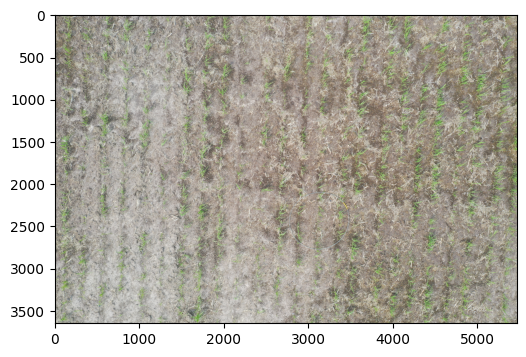

In [675]:
image = cv.imread(image_file)

im = cv.cvtColor(image, cv.COLOR_BGR2RGB)
fig = plt.figure(figsize=(6,4))
plt.imshow(im)
plt.show()

### Labels

In [676]:
labels_file = build_filename(dset='train', dtype='labels', name=PROCESSING_FILE)
#labels_file = build_filename(dset=SUBSET, dtype='', name=PROCESSING_FILE) + 'txt' # Open file directly

In [677]:
with open(labels_file, 'r') as file:
    lines = file.readlines()
    lines = [line.strip() for line in lines]
    labels = [line.split() for line in lines]

In [678]:
# Convierte de string a int/float
labels = [[int(value) if i == 0 else float(value) 
                for i, value in enumerate(label)] for label in labels]

class_id | x_center | y_center | width | height (normalized values)

In [679]:
df_labels = pd.DataFrame(labels, columns=['class_id', 'x_center', 'y_center', 'width', 'height'])

# Procesamiento

In [680]:
df_labels

,class_id,x_center,y_center,width,height
0,0,0.022295,0.009320,0.015351,0.018092
1,0,0.025585,0.022204,0.010234,0.009868
2,0,0.027595,0.070175,0.009137,0.008772
3,0,0.026133,0.127741,0.010965,0.008224
4,0,0.022661,0.059211,0.018640,0.013158
...,...,...,...,...,...
1571,0,0.974232,0.948739,0.009503,0.008772
1572,0,0.976791,0.992599,0.013158,0.012610
1573,0,0.939693,0.873081,0.011696,0.006031
1574,0,0.975694,0.997533,0.014985,0.006579


## Detección de clusters

In [681]:
# tolerancia_distancia = 0.01  # Ajusta este valor según la dispersión de tus puntos
# min_puntos = 5  # Ajusta este valor según la densidad de tus puntos

# df_clusters = identificar_clusters(df_labels, tolerancia_distancia, min_puntos)
# df_clusters

## ⚠️ Mejorar detección de rectas ⚠️

In [682]:
# Ejemplo de uso
#recta = definir_recta_manual(df_labels)
recta = definir_recta_manual(grad=92) # 17 grados

Recta definida manualmente: Recta(m=-28.636253282915618, b=0)


In [683]:
tolerancia_distancia = 0.005  # Ajusta este valor según la dispersión de tus puntos
min_puntos = 3  # Ajusta este valor según la densidad de tus puntos

df_clusters = identificar_clusters_class(df_labels, tolerancia_distancia, min_puntos, recta)
df_clusters

,class_id,x,y,x_rotado,y_rotado,cluster
0,0,0.022295,0.009320,-0.008536,0.022607,0
1,0,0.025585,0.022204,-0.021298,0.026344,0
2,0,0.027595,0.070175,-0.069170,0.030027,0
3,0,0.026133,0.127741,-0.126751,0.030575,0
4,0,0.022661,0.059211,-0.058384,0.024713,0
...,...,...,...,...,...,...
1571,0,0.974232,0.948739,-0.914161,1.006749,22
1572,0,0.976791,0.992599,-0.957905,1.010837,22
1573,0,0.939693,0.873081,-0.839754,0.969591,20
1574,0,0.975694,0.997533,-0.962874,1.009913,22


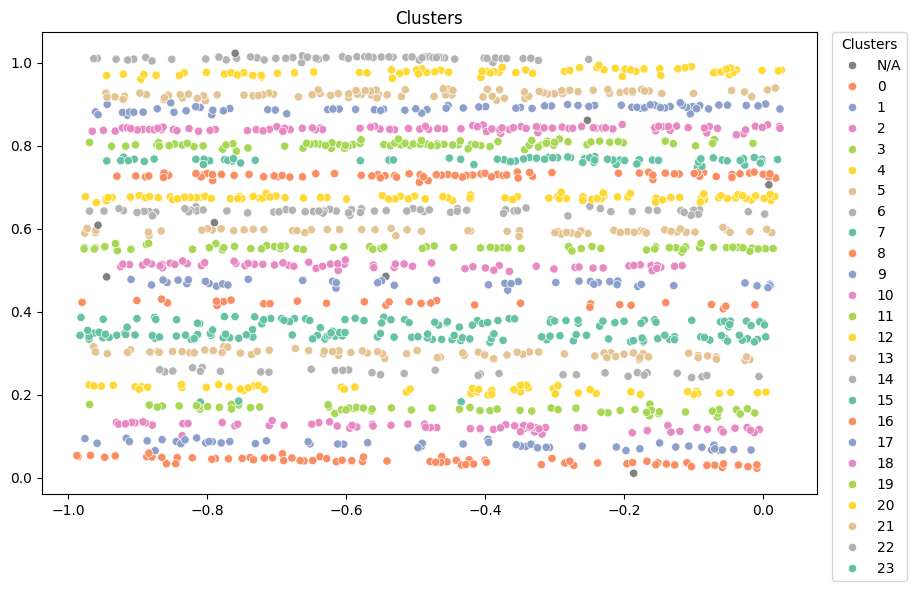

In [684]:
graficar_clusters(df_clusters, rotated=True)

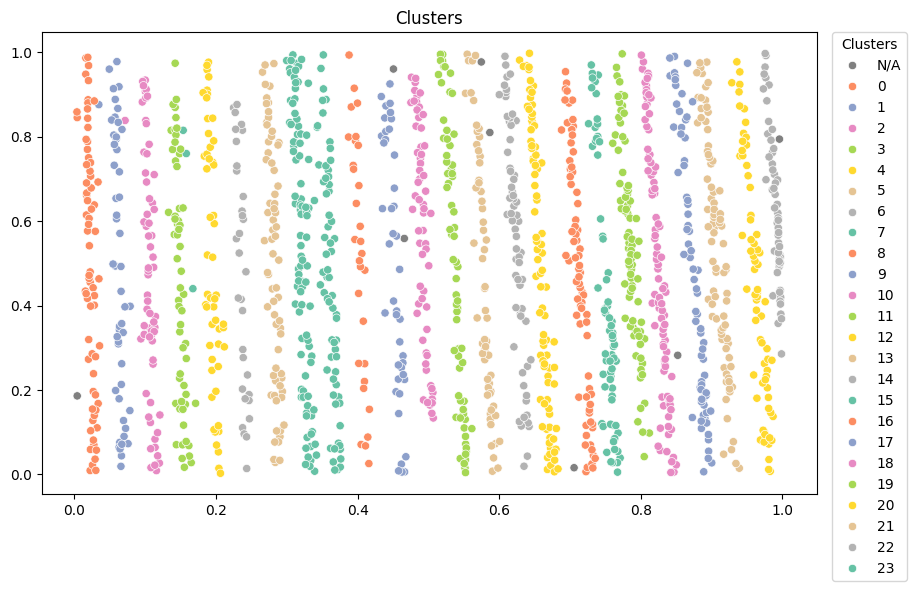

In [685]:
graficar_clusters(df_clusters, rotated=False)

In [686]:
df_lines = identificar_rectas_paralelas(df_clusters)
print(f"Total de líneas detectadas: {len(df_lines)}")

Total de líneas detectadas: 24


In [687]:
df_lines

,cluster,m,b
0,0,-28.445198,1.151492
1,1,-26.102208,2.124718
2,3,-28.375936,4.686518
3,2,-22.595675,2.864378
4,4,-27.545256,5.878811
...,...,...,...
19,19,-17.812835,14.525121
20,20,-17.338915,17.141988
21,21,-16.537760,15.533848
22,22,-21.858915,22.262263


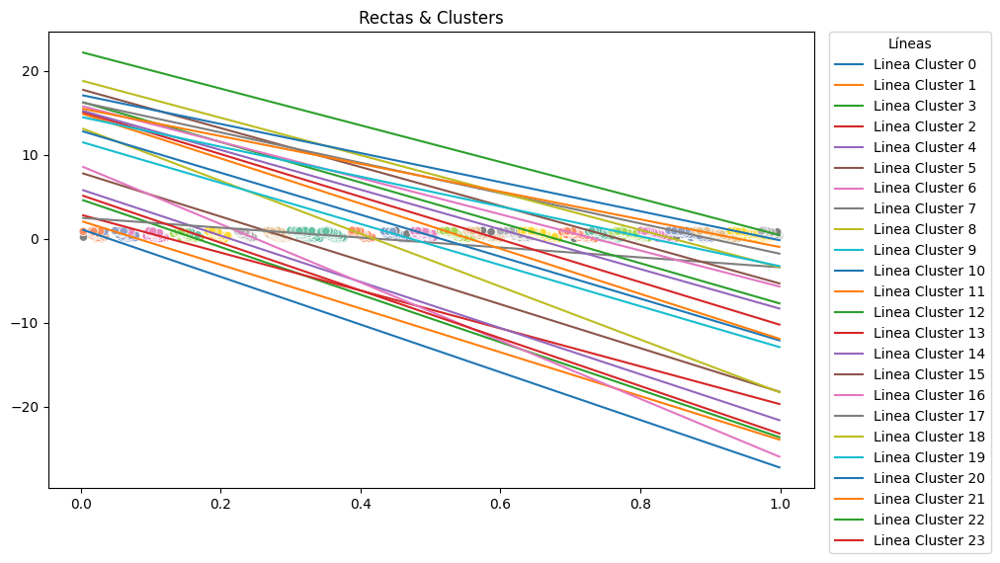

In [688]:
graficar_lineas_clusters(df_clusters, df_lines)

## Análisis de puntos no asignados _(sin cluster)_

In [689]:
no_cluster = df_clusters[df_clusters['cluster']<0]
no_cluster

,class_id,x,y,x_rotado,y_rotado,cluster
187,0,0.705775,0.015899,0.008742,0.705900,-1
246,0,0.004020,0.186129,-0.185876,0.010514,-1
478,0,0.852156,0.282346,-0.252435,0.861491,-1
900,0,0.466009,0.559211,-0.542606,0.485241,-1
1240,0,0.586806,0.810307,-0.789334,0.614727,-1
1353,0,0.995797,0.794682,-0.759445,1.022924,-1
1452,0,0.450658,0.960800,-0.944487,0.483915,-1
1477,0,0.574744,0.977522,-0.956868,0.608509,-1


In [690]:
def distancia_punto_recta(punto, recta):
    """Calcula la distancia de un punto a una recta."""
    x, y = punto
    m, b = recta
    A = -m
    B = 1
    C = -b
    distancia = abs(A * x + B * y + C) / np.sqrt(A**2 + B**2)
    return distancia

In [691]:
no_cluster

,class_id,x,y,x_rotado,y_rotado,cluster
187,0,0.705775,0.015899,0.008742,0.705900,-1
246,0,0.004020,0.186129,-0.185876,0.010514,-1
478,0,0.852156,0.282346,-0.252435,0.861491,-1
900,0,0.466009,0.559211,-0.542606,0.485241,-1
1240,0,0.586806,0.810307,-0.789334,0.614727,-1
1353,0,0.995797,0.794682,-0.759445,1.022924,-1
1452,0,0.450658,0.960800,-0.944487,0.483915,-1
1477,0,0.574744,0.977522,-0.956868,0.608509,-1


In [692]:
# ANÁLISIS DE PUNTOS NO ASIGNADOS
# Cada punto se asigna a su cluster más cercano
for point_idx, point in no_cluster.iterrows():
    punto = (point['x'], point['y'])
    distancias = []

    for index, row in df_lines.iterrows():
        m = row['m']
        b = row['b']
        recta = (m, b)
        distancia = distancia_punto_recta(punto, recta).item()
        distancias.append(distancia)

    min_dist, min_idx = min((dist, idx) for idx, dist in enumerate(distancias))
    df_clusters.loc[point_idx, 'cluster'] = df_lines.iloc[min_idx]['cluster']

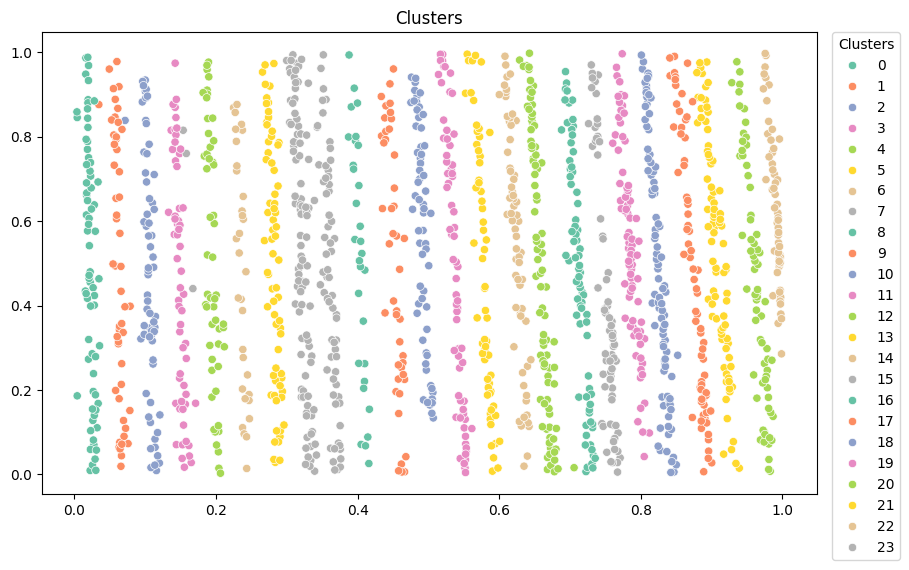

In [693]:
graficar_clusters(df_clusters)

## Eliminar puntos por umbral (maleza)

Podemos ver que, dado que los puntos presenta gran dispersión, con un umbral de 3 desviaciones estándar no es suficiente, ya que excluye algunas plantas que pertenecen al surco. 

In [694]:
# CÁLCULO CON DESVIACION ESTÁNDAR MEDIA (EVITA SESGOS POR DISPERSION EN LÍNEAS)

# Calcular la dispersión y establecer un umbral
umbral = 4.0 # Cantidad de desviaciones estándar (generalmente 3)

print(f"Detectando outliers con umbral: {umbral} desviaciones estándar")
df_clusters['outlier'] = False

for index, row in df_lines.iterrows():
    cluster_id = row['cluster']

    # Calcula la recta
    m = row['m']
    b = row['b']
    recta = (m, b)

    # Calcula la dispersión para cada punto
    df_cluster_indices = df_clusters['cluster'] == cluster_id
    desviacion_estandar, distancias = calcular_dispersion_cluster(df_clusters.loc[df_cluster_indices], recta)

    # Crea las nuevas columnas en df_clusters directamente
    if 'distancia' not in df_clusters.columns:
        df_clusters['distancia'] = np.nan
    if 'desviacion_estandar' not in df_clusters.columns:
        df_clusters['desviacion_estandar'] = np.nan

    # Asigna las métricas al DataFrame
    df_clusters.loc[df_cluster_indices, 'distancia'] = distancias
    df_clusters.loc[df_cluster_indices, 'desviacion_estandar'] = desviacion_estandar

df_lines = pd.merge(df_lines,df_clusters[['cluster','desviacion_estandar']].drop_duplicates(),how='left')
desviacion_estandar_media = df_lines['desviacion_estandar'].mean()
print(f"Desviación estándar media: {desviacion_estandar_media}\n")

# VERIFICACIÓN DE PERTENENCIA A CLUSTERS
for index, row in df_lines.iterrows():
    cluster_id = row['cluster']
    df_cluster_indices = df_clusters['cluster'] == cluster_id

    # Identificar outliers
    outlier_indices = df_clusters.loc[df_cluster_indices, 'distancia'] > umbral * desviacion_estandar_media
    outliers = df_clusters.loc[df_cluster_indices][outlier_indices] #filtra las filas que cumplen la condicion.

    # Asigna las métricas al DataFrame
    df_clusters.loc[outliers.index, 'outlier'] = True

    print(f"Cluster {cluster_id:.0f}:")
    print(f"  Desviación estándar: {desviacion_estandar:.5f}")
    print(f"  Outliers detectados: {len(outliers)}\n")

total_outliers = len(df_clusters[df_clusters['outlier'] == True])
df_outliers = df_clusters[df_clusters['outlier'] == True]

print(f"Total de Outliers detectados: {total_outliers}\n")

Detectando outliers con umbral: 4.0 desviaciones estándar
Desviación estándar media: 0.0046290201123112135

Cluster 0:
  Desviación estándar: 0.00040
  Outliers detectados: 2

Cluster 1:
  Desviación estándar: 0.00040
  Outliers detectados: 0

Cluster 3:
  Desviación estándar: 0.00040
  Outliers detectados: 1

Cluster 2:
  Desviación estándar: 0.00040
  Outliers detectados: 1

Cluster 4:
  Desviación estándar: 0.00040
  Outliers detectados: 0

Cluster 5:
  Desviación estándar: 0.00040
  Outliers detectados: 0

Cluster 6:
  Desviación estándar: 0.00040
  Outliers detectados: 0

Cluster 7:
  Desviación estándar: 0.00040
  Outliers detectados: 116

Cluster 8:
  Desviación estándar: 0.00040
  Outliers detectados: 0

Cluster 9:
  Desviación estándar: 0.00040
  Outliers detectados: 0

Cluster 10:
  Desviación estándar: 0.00040
  Outliers detectados: 0

Cluster 11:
  Desviación estándar: 0.00040
  Outliers detectados: 0

Cluster 12:
  Desviación estándar: 0.00040
  Outliers detectados: 1

Clu

In [695]:
df_outliers

,class_id,x,y,x_rotado,y_rotado,cluster,outlier,distancia,desviacion_estandar
22,0,0.144006,0.070450,-0.065381,0.146377,3,True,0.018658,0.004185
65,0,0.375365,0.115406,-0.102235,0.379164,7,True,0.027264,0.023993
66,0,0.375548,0.059759,-0.046616,0.377405,7,True,0.036382,0.023993
67,0,0.334978,0.138980,-0.127205,0.339624,7,True,0.063145,0.023993
68,0,0.371893,0.011513,0.001473,0.372069,7,True,0.048047,0.023993
...,...,...,...,...,...,...,...,...,...
1430,0,0.355446,0.888432,-0.875486,0.386235,7,True,0.082260,0.023993
1432,0,0.351608,0.994243,-0.981367,0.386093,7,True,0.096157,0.023993
1434,0,0.350694,0.886513,-0.873734,0.381420,7,True,0.077255,0.023993
1527,0,0.873173,0.883224,-0.852212,0.903465,17,True,0.021542,0.004509


Se han identificado un total de 26 potenciales outliers.

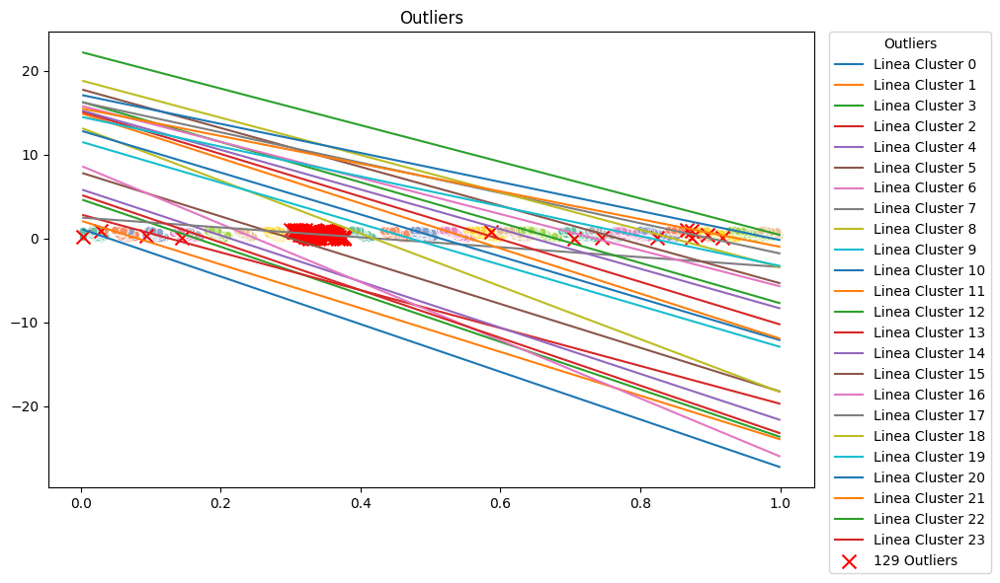

In [696]:
graficar_outliers(df_clusters, df_lines, df_outliers)

Utilizando un umbral de 4 desviaciones estándar se consigue filtrar todas aquellas plantas que se encuentran entre dos surcos (claramente malezas o arroz guacho).

# Conteo parcial (Output del modelo)

In [697]:
df_labels_original = df_labels.copy()
df_labels = pd.merge(df_labels,df_clusters[['cluster','outlier']],how='left', left_index=True, right_index=True)
df_labels['cluster'] = df_labels['cluster'].astype(int)
df_labels

,class_id,x_center,y_center,width,height,cluster,outlier
0,0,0.022295,0.009320,0.015351,0.018092,0,False
1,0,0.025585,0.022204,0.010234,0.009868,0,False
2,0,0.027595,0.070175,0.009137,0.008772,0,False
3,0,0.026133,0.127741,0.010965,0.008224,0,False
4,0,0.022661,0.059211,0.018640,0.013158,0,False
...,...,...,...,...,...,...,...
1571,0,0.974232,0.948739,0.009503,0.008772,22,False
1572,0,0.976791,0.992599,0.013158,0.012610,22,False
1573,0,0.939693,0.873081,0.011696,0.006031,20,False
1574,0,0.975694,0.997533,0.014985,0.006579,22,False


In [698]:
if len(df_labels) == len(df_clusters):
    print("No se han perdido etiquetas en el proceso.")
else:
    print("CUIDADO: Se han perdido etiquetas en el proceso.")

No se han perdido etiquetas en el proceso.


In [699]:
df_plants = df_labels[df_labels['outlier']==False]
df_plants

,class_id,x_center,y_center,width,height,cluster,outlier
0,0,0.022295,0.009320,0.015351,0.018092,0,False
1,0,0.025585,0.022204,0.010234,0.009868,0,False
2,0,0.027595,0.070175,0.009137,0.008772,0,False
3,0,0.026133,0.127741,0.010965,0.008224,0,False
4,0,0.022661,0.059211,0.018640,0.013158,0,False
...,...,...,...,...,...,...,...
1571,0,0.974232,0.948739,0.009503,0.008772,22,False
1572,0,0.976791,0.992599,0.013158,0.012610,22,False
1573,0,0.939693,0.873081,0.011696,0.006031,20,False
1574,0,0.975694,0.997533,0.014985,0.006579,22,False


In [700]:
n_plants = len(df_plants)
n_outliers = len(df_outliers)
print(f"Se han detectado un total de {n_plants} plantas y {n_outliers} outliers (malezas).")

Se han detectado un total de 1447 plantas y 129 outliers (malezas).


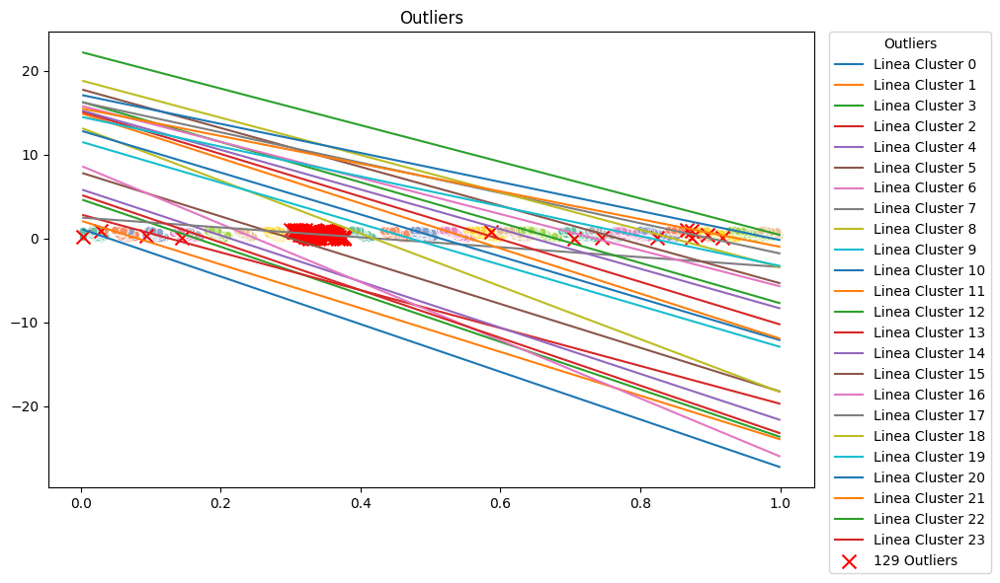

In [701]:
# Outliers detectados
graficar_outliers(df_clusters, df_lines, df_outliers)

In [702]:
df_labels = df_labels_original.copy()

-----

## Asignación de outliers a rectas adyacentes

El otro problema a resolver es que al usar DBSCAN algunos puntos son erróneamente asignados a rectas. Para solucionar esto, lo que haremos será asignar cada outlier a la recta inmediata adyacente y volver a verificar si pertenecen a dicha recta (falsos positivos = no serían outliers).

Se ordenan las líneas (de forma perpendicular) y se crea un nuevo índice para poder reasignar los puntos a la línea adyacente.

In [703]:
df_lines.sort_values(by='b', ascending=False,ignore_index=True,inplace=True)
df_lines.reset_index(inplace=True)
df_lines.rename(columns={'index': 'id_linea'}, inplace=True)

In [704]:
df_lines

,id_linea,cluster,m,b,desviacion_estandar
0,0,22,-21.858915,22.262263,0.002760
1,1,18,-22.295367,18.874019,0.003839
2,2,15,-23.174906,17.817628,0.003815
3,3,20,-17.338915,17.141988,0.003913
4,4,12,-24.071244,16.334747,0.003939
...,...,...,...,...,...
19,19,3,-28.375936,4.686518,0.004185
20,20,2,-22.595675,2.864378,0.005268
21,21,7,-5.900698,2.493496,0.023993
22,22,1,-26.102208,2.124718,0.004710


Se agrega dicho índice al DataFrame de outliers.

In [705]:
df_outliers = df_outliers.reset_index()
df_outliers_fp = pd.merge(df_outliers, df_lines[['cluster', 'id_linea', 'b']], on='cluster', how='left')
df_outliers_fp = df_outliers_fp.set_index('index')

In [706]:
# Se ordenan los outliers para simplificar su procesamiento
df_outliers_fp.sort_values(by='id_linea',inplace=True)
df_outliers_fp

,class_id,x,y,x_rotado,y_rotado,cluster,outlier,distancia,desviacion_estandar,id_linea,b
index,,,,,,,,,,,
217,0,0.824561,0.066886,-0.038068,0.826393,18,True,0.018964,0.003839,1,18.874019
167,0,0.745066,0.120340,-0.094264,0.748812,15,True,0.018557,0.003815,2,17.817628
187,0,0.705775,0.015899,0.008742,0.705900,12,True,0.027811,0.003939,4,16.334747
202,0,0.872807,0.134868,-0.104326,0.876982,17,True,0.020138,0.004509,5,16.284787
1527,0,0.873173,0.883224,-0.852212,0.903465,17,True,0.021542,0.004509,5,16.284787
...,...,...,...,...,...,...,...,...,...,...,...
1434,0,0.350694,0.886513,-0.873734,0.381420,7,True,0.077255,0.023993,21,2.493496
1430,0,0.355446,0.888432,-0.875486,0.386235,7,True,0.082260,0.023993,21,2.493496
71,0,0.339364,0.007675,0.004173,0.339425,7,True,0.080760,0.023993,21,2.493496


Se compara la posición del punto respecto a "su recta" para determinar si está por encima o por debajo de la misma, y luego poder reasignarlo a la línea inmediata siguiente.

In [707]:
def linea_adyacente(row):
    y = row['y_rotado']
    b = row['b']
    print(f"cluster: {row['cluster']} con orden {row['id_linea']}")
    print("y rotado:", y)
    print("y línea:", b)
    if y > b:
        print(">> Arriba de la Linea")
        row['id_linea'] -= 1
    else:
        print(">> Debajo de la línea")
        row['id_linea'] += 1
    print(f"Mover al cluster con orden {row['id_linea']}")
    print()
    return row

In [708]:
df_outliers_fp = df_outliers_fp.apply(linea_adyacente, axis=1)

cluster: 18 con orden 1
y rotado: 0.8263933894925576
y línea: 18.874018582007327
>> Debajo de la línea
Mover al cluster con orden 2

cluster: 15 con orden 2
y rotado: 0.7488117178975603
y línea: 17.81762842164585
>> Debajo de la línea
Mover al cluster con orden 3

cluster: 12 con orden 4
y rotado: 0.7058997862136084
y línea: 16.33474742153481
>> Debajo de la línea
Mover al cluster con orden 5

cluster: 17 con orden 5
y rotado: 0.8769821671070261
y línea: 16.28478682612963
>> Debajo de la línea
Mover al cluster con orden 6

cluster: 17 con orden 5
y rotado: 0.9034646635709843
y línea: 16.28478682612963
>> Debajo de la línea
Mover al cluster con orden 6

cluster: 17 con orden 5
y rotado: 0.8995275393657859
y línea: 16.28478682612963
>> Debajo de la línea
Mover al cluster con orden 6

cluster: 21 con orden 7
y rotado: 0.909406397917571
y línea: 15.533847939737235
>> Debajo de la línea
Mover al cluster con orden 8

cluster: 21 con orden 7
y rotado: 0.9181477134258459
y línea: 15.5338479397

In [709]:
df_outliers_fp

,class_id,x,y,x_rotado,y_rotado,cluster,outlier,distancia,desviacion_estandar,id_linea,b
index,,,,,,,,,,,
217,0,0.824561,0.066886,-0.038068,0.826393,18,True,0.018964,0.003839,2,18.874019
167,0,0.745066,0.120340,-0.094264,0.748812,15,True,0.018557,0.003815,3,17.817628
187,0,0.705775,0.015899,0.008742,0.705900,12,True,0.027811,0.003939,5,16.334747
202,0,0.872807,0.134868,-0.104326,0.876982,17,True,0.020138,0.004509,6,16.284787
1527,0,0.873173,0.883224,-0.852212,0.903465,17,True,0.021542,0.004509,6,16.284787
...,...,...,...,...,...,...,...,...,...,...,...
1434,0,0.350694,0.886513,-0.873734,0.381420,7,True,0.077255,0.023993,22,2.493496
1430,0,0.355446,0.888432,-0.875486,0.386235,7,True,0.082260,0.023993,22,2.493496
71,0,0.339364,0.007675,0.004173,0.339425,7,True,0.080760,0.023993,22,2.493496


#### Re-asignación de clusterss

Se asigna el cluster correspondiente al nuevo `id_linea` calculado.

In [710]:
# Actualiza para df_outliers_fp el valor 'cluster' según la nueva asignación de recta ('id_linea')
df_outliers_fp = df_outliers_fp.reset_index()
df_outliers_fp = pd.merge(df_outliers_fp, df_lines[['id_linea', 'cluster']], on='id_linea', how='left', suffixes=('_outliers', '_lines'))
df_outliers_fp['cluster'] = df_outliers_fp['cluster_lines']
df_outliers_fp.drop('cluster_lines', axis=1, inplace=True)
df_outliers_fp.rename(columns={'cluster_outliers': 'cluster_original'},inplace=True)
df_outliers_fp = df_outliers_fp.set_index('index')

In [711]:
# En caso de NaN para cluster, mantiene el cluster original
df_outliers_fp['cluster'] = df_outliers_fp['cluster'].fillna(df_clusters.loc[df_outliers_fp.index, 'cluster'])
df_outliers_fp['cluster'] = df_outliers_fp['cluster'].astype(int)
df_outliers_fp[['cluster_original','id_linea','cluster']]

,cluster_original,id_linea,cluster
index,,,
217,18,2,15
167,15,3,20
187,12,5,17
202,17,6,16
1527,17,6,16
...,...,...,...
1434,7,22,1
1430,7,22,1
71,7,22,1


NOTA: recordar que cuando es NaN se conserva el cluster original.

In [712]:
# Crea un nuevo df_clusters con las asignaciones de cluster actualizadas
df_clusters_fp = df_clusters.copy()
df_clusters_fp.iloc[df_outliers_fp.index, df_clusters_fp.columns.get_loc('cluster')] = df_outliers_fp['cluster'].values

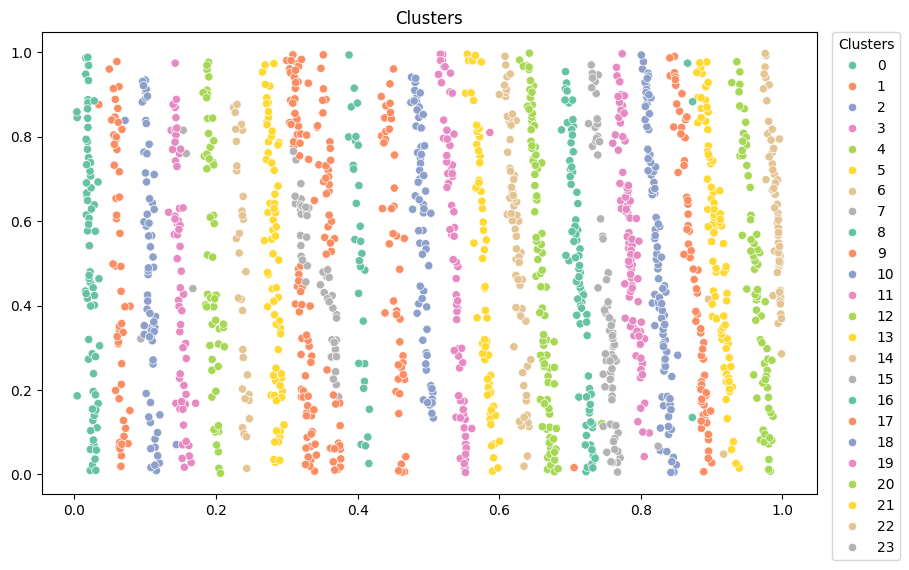

In [713]:
graficar_clusters(df_clusters_fp)

## Verificación de outliers para el cluster adyacente

In [714]:
df_outliers_fp['outlier'] = False
df_outliers_fp

,class_id,x,y,x_rotado,y_rotado,cluster_original,outlier,distancia,desviacion_estandar,id_linea,b,cluster
index,,,,,,,,,,,,
217,0,0.824561,0.066886,-0.038068,0.826393,18,False,0.018964,0.003839,2,18.874019,15
167,0,0.745066,0.120340,-0.094264,0.748812,15,False,0.018557,0.003815,3,17.817628,20
187,0,0.705775,0.015899,0.008742,0.705900,12,False,0.027811,0.003939,5,16.334747,17
202,0,0.872807,0.134868,-0.104326,0.876982,17,False,0.020138,0.004509,6,16.284787,16
1527,0,0.873173,0.883224,-0.852212,0.903465,17,False,0.021542,0.004509,6,16.284787,16
...,...,...,...,...,...,...,...,...,...,...,...,...
1434,0,0.350694,0.886513,-0.873734,0.381420,7,False,0.077255,0.023993,22,2.493496,1
1430,0,0.355446,0.888432,-0.875486,0.386235,7,False,0.082260,0.023993,22,2.493496,1
71,0,0.339364,0.007675,0.004173,0.339425,7,False,0.080760,0.023993,22,2.493496,1


In [715]:
df_outliers.head(20)

,index,class_id,x,y,x_rotado,y_rotado,cluster,outlier,distancia,desviacion_estandar
0,22,0,0.144006,0.070450,-0.065381,0.146377,3,True,0.018658,0.004185
1,65,0,0.375365,0.115406,-0.102235,0.379164,7,True,0.027264,0.023993
2,66,0,0.375548,0.059759,-0.046616,0.377405,7,True,0.036382,0.023993
3,67,0,0.334978,0.138980,-0.127205,0.339624,7,True,0.063145,0.023993
4,68,0,0.371893,0.011513,0.001473,0.372069,7,True,0.048047,0.023993
5,69,0,0.375548,0.017544,-0.004427,0.375932,7,True,0.043436,0.023993
6,70,0,0.336075,0.101151,-0.089361,0.339400,7,True,0.068385,0.023993
7,71,0,0.339364,0.007675,0.004173,0.339425,7,True,0.080760,0.023993
8,72,0,0.372990,0.074013,-0.060951,0.375346,7,True,0.036523,0.023993
9,73,0,0.376279,0.036732,-0.023578,0.377332,7,True,0.039509,0.023993


In [716]:
df_outliers_fp.head(20)

,class_id,x,y,x_rotado,y_rotado,cluster_original,outlier,distancia,desviacion_estandar,id_linea,b,cluster
index,,,,,,,,,,,,
217,0,0.824561,0.066886,-0.038068,0.826393,18,False,0.018964,0.003839,2,18.874019,15
167,0,0.745066,0.120340,-0.094264,0.748812,15,False,0.018557,0.003815,3,17.817628,20
187,0,0.705775,0.015899,0.008742,0.705900,12,False,0.027811,0.003939,5,16.334747,17
202,0,0.872807,0.134868,-0.104326,0.876982,17,False,0.020138,0.004509,6,16.284787,16
1527,0,0.873173,0.883224,-0.852212,0.903465,17,False,0.021542,0.004509,6,16.284787,16
1537,0,0.866045,0.974507,-0.943688,0.899528,17,False,0.019466,0.004509,6,16.284787,16
721,0,0.895468,0.415022,-0.383518,0.909406,21,False,0.018698,0.004238,8,15.533848,14
226,0,0.917032,0.047971,-0.015938,0.918148,21,False,0.019328,0.004238,8,15.533848,14
1240,0,0.586806,0.810307,-0.789334,0.614727,13,False,0.022245,0.003872,10,15.174799,11


In [717]:
# VERIFICACIÓN DE PERTENENCIA A CLUSTERS

umbral = 5

print(f"Detectando outliers con umbral: {umbral} desviaciones estándar")
df_outliers_fp['outlier'] = False

desviacion_estandar_media = df_lines['desviacion_estandar'].mean()
print(f"Desviación estándar media: {desviacion_estandar_media}\n")

for index, row in df_lines.iterrows():
    recta = (row['m'], row['b'])
    cluster_id = row['cluster']
    df_cluster_indices = df_outliers_fp['cluster'] == cluster_id
    desviacion_estandar = df_lines[df_lines['cluster'] == cluster_id]['desviacion_estandar'].values[0]

    for point_idx, point in df_outliers_fp.loc[df_cluster_indices].iterrows():
        punto = (point['x'], point['y'])
        distancia = distancia_punto_recta(punto, recta).item()
        df_outliers_fp.loc[point_idx, 'distancia'] = distancia

    # Identificar outliers
    outlier_indices = df_outliers_fp.loc[df_cluster_indices, 'distancia'] > umbral * desviacion_estandar_media
    outliers = df_outliers_fp.loc[df_cluster_indices][outlier_indices] #filtra las filas que cumplen la condicion.

    # Asigna las métricas al DataFrame
    df_outliers_fp.loc[outliers.index, 'outlier'] = True
    print(f"Cluster {cluster_id:.0f}:")
    print(f"  Desviación estándar: {desviacion_estandar:.5f}")
    print(f"  Outliers detectados: {len(outliers)}\n")

total_outliers = len(df_outliers_fp[df_outliers_fp['outlier'] == True])
df_outliers = df_outliers_fp[df_outliers_fp['outlier'] == True] # Asigna los verdaderos positivos a df_outliers

print(f"Total de Outliers detectados: {total_outliers}\n")

Detectando outliers con umbral: 5 desviaciones estándar
Desviación estándar media: 0.0046290201123112135

Cluster 22:
  Desviación estándar: 0.00276
  Outliers detectados: 0

Cluster 18:
  Desviación estándar: 0.00384
  Outliers detectados: 0

Cluster 15:
  Desviación estándar: 0.00381
  Outliers detectados: 1

Cluster 20:
  Desviación estándar: 0.00391
  Outliers detectados: 1

Cluster 12:
  Desviación estándar: 0.00394
  Outliers detectados: 0

Cluster 17:
  Desviación estándar: 0.00451
  Outliers detectados: 1

Cluster 16:
  Desviación estándar: 0.00348
  Outliers detectados: 3

Cluster 21:
  Desviación estándar: 0.00424
  Outliers detectados: 0

Cluster 14:
  Desviación estándar: 0.00347
  Outliers detectados: 2

Cluster 13:
  Desviación estándar: 0.00387
  Outliers detectados: 0

Cluster 11:
  Desviación estándar: 0.00292
  Outliers detectados: 1

Cluster 19:
  Desviación estándar: 0.00376
  Outliers detectados: 0

Cluster 8:
  Desviación estándar: 0.00285
  Outliers detectados: 0

In [718]:
df_outliers_fp

,class_id,x,y,x_rotado,y_rotado,cluster_original,outlier,distancia,desviacion_estandar,id_linea,b,cluster
index,,,,,,,,,,,,
217,0,0.824561,0.066886,-0.038068,0.826393,18,True,0.058560,0.003839,2,18.874019,15
167,0,0.745066,0.120340,-0.094264,0.748812,15,True,0.236244,0.003815,3,17.817628,20
187,0,0.705775,0.015899,0.008742,0.705900,12,True,0.193484,0.003939,5,16.334747,17
202,0,0.872807,0.134868,-0.104326,0.876982,17,True,0.144255,0.004509,6,16.284787,16
1527,0,0.873173,0.883224,-0.852212,0.903465,17,True,0.179268,0.004509,6,16.284787,16
...,...,...,...,...,...,...,...,...,...,...,...,...
1434,0,0.350694,0.886513,-0.873734,0.381420,7,True,0.303035,0.023993,22,2.493496,1
1430,0,0.355446,0.888432,-0.875486,0.386235,7,True,0.307857,0.023993,22,2.493496,1
71,0,0.339364,0.007675,0.004173,0.339425,7,True,0.258069,0.023993,22,2.493496,1


In [719]:
df_outliers_fp[df_outliers_fp.isna().any(axis=1)]

,class_id,x,y,x_rotado,y_rotado,cluster_original,outlier,distancia,desviacion_estandar,id_linea,b,cluster
index,,,,,,,,,,,,


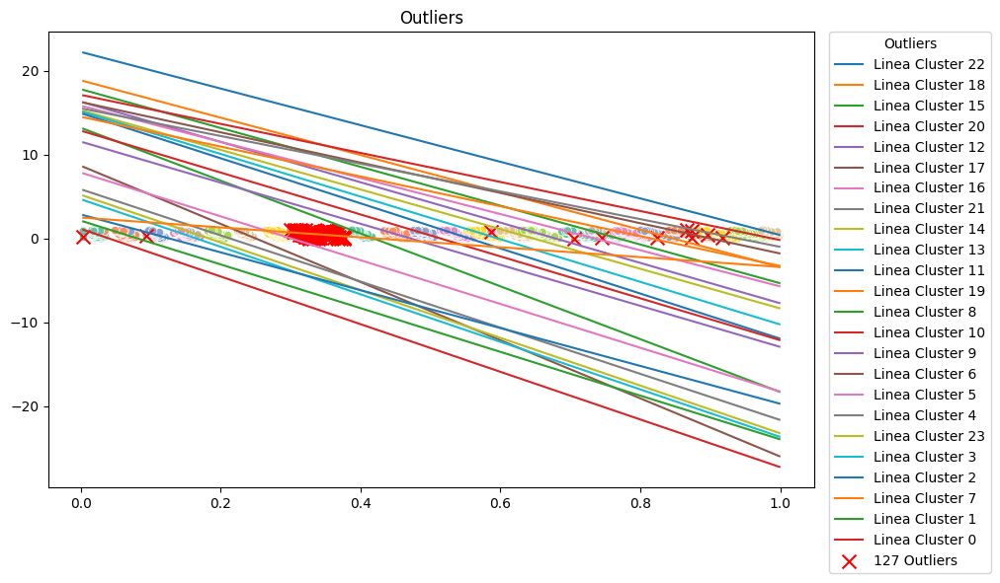

In [720]:
graficar_outliers(df_clusters_fp, df_lines, df_outliers)

### Falsos positivos

Sólo aquellos objetos que fueron detectados como outliers para ambas líneas, son realmente outliers (verdaderos positivios).

Los demás fueron errónemanete asignados desde un principio (falsos positivos).

In [721]:
# DEBEN SER REASIGNADOS A SU CLUSTER
falsos_positivos = df_outliers_fp[df_outliers_fp['outlier']==False]
falsos_positivos

,class_id,x,y,x_rotado,y_rotado,cluster_original,outlier,distancia,desviacion_estandar,id_linea,b,cluster
index,,,,,,,,,,,,
22,0,0.144006,0.070450,-0.065381,0.146377,3,False,0.020337,0.004185,20,4.686518,2
1369,0,0.028143,0.885143,-0.883621,0.059017,0,False,0.018768,0.005260,24,1.151492,0


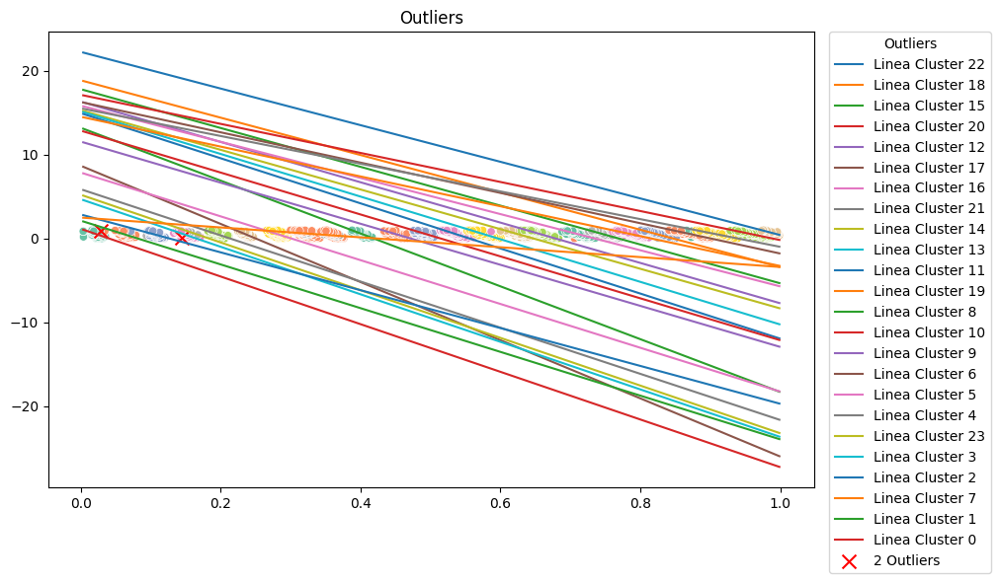

In [722]:
# FALSOS POSITIVOS
# Estos objetos se han sido detectado de forma erróneas (pertenecen a la línea adyacente)
graficar_outliers(df_clusters_fp, df_lines, falsos_positivos)

### Verdaderos positivos _(Outliers reales)_

In [723]:
# VERDADREOS POSITIVOS (OUTLIERS REALES)
verdaderos_positivos = df_outliers_fp[df_outliers_fp['outlier']==True]
verdaderos_positivos

,class_id,x,y,x_rotado,y_rotado,cluster_original,outlier,distancia,desviacion_estandar,id_linea,b,cluster
index,,,,,,,,,,,,
217,0,0.824561,0.066886,-0.038068,0.826393,18,True,0.058560,0.003839,2,18.874019,15
167,0,0.745066,0.120340,-0.094264,0.748812,15,True,0.236244,0.003815,3,17.817628,20
187,0,0.705775,0.015899,0.008742,0.705900,12,True,0.193484,0.003939,5,16.334747,17
202,0,0.872807,0.134868,-0.104326,0.876982,17,True,0.144255,0.004509,6,16.284787,16
1527,0,0.873173,0.883224,-0.852212,0.903465,17,True,0.179268,0.004509,6,16.284787,16
...,...,...,...,...,...,...,...,...,...,...,...,...
1424,0,0.351060,0.856634,-0.843860,0.380742,7,True,0.302257,0.023993,22,2.493496,1
1434,0,0.350694,0.886513,-0.873734,0.381420,7,True,0.303035,0.023993,22,2.493496,1
1430,0,0.355446,0.888432,-0.875486,0.386235,7,True,0.307857,0.023993,22,2.493496,1


In [724]:
df_outliers[df_outliers['outlier']==True]

,class_id,x,y,x_rotado,y_rotado,cluster_original,outlier,distancia,desviacion_estandar,id_linea,b,cluster
index,,,,,,,,,,,,
217,0,0.824561,0.066886,-0.038068,0.826393,18,True,0.058560,0.003839,2,18.874019,15
167,0,0.745066,0.120340,-0.094264,0.748812,15,True,0.236244,0.003815,3,17.817628,20
187,0,0.705775,0.015899,0.008742,0.705900,12,True,0.193484,0.003939,5,16.334747,17
202,0,0.872807,0.134868,-0.104326,0.876982,17,True,0.144255,0.004509,6,16.284787,16
1527,0,0.873173,0.883224,-0.852212,0.903465,17,True,0.179268,0.004509,6,16.284787,16
...,...,...,...,...,...,...,...,...,...,...,...,...
1424,0,0.351060,0.856634,-0.843860,0.380742,7,True,0.302257,0.023993,22,2.493496,1
1434,0,0.350694,0.886513,-0.873734,0.381420,7,True,0.303035,0.023993,22,2.493496,1
1430,0,0.355446,0.888432,-0.875486,0.386235,7,True,0.307857,0.023993,22,2.493496,1


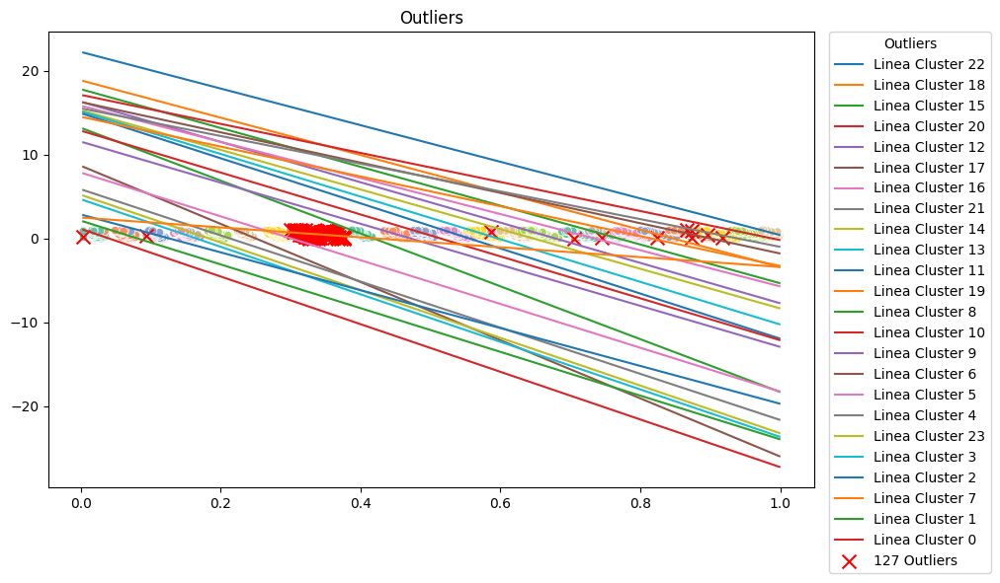

In [725]:
# Estos objetos se han identificado como clasificaciones erróneas (pertenecen a la línea adyacente)
graficar_outliers(df_clusters_fp, df_lines, verdaderos_positivos)

### Outliers _(alternativa)_
Otra forma de detectarlos es aplicando un operador lógico `AND`, ya que sólo aquellos puntos detectados como "outliers" en ambos conjuntos son los verdareros outliers (verdaderos positivos).

In [726]:
# OPERADOR LÓGICO 'AND'
pd.merge(df_outliers, df_outliers_fp, left_index=True, right_index=True, how='inner')

,class_id_x,x_x,y_x,x_rotado_x,y_rotado_x,cluster_original_x,outlier_x,distancia_x,desviacion_estandar_x,id_linea_x,b_x,cluster_x,class_id_y,x_y,y_y,x_rotado_y,y_rotado_y,cluster_original_y,outlier_y,distancia_y,desviacion_estandar_y,id_linea_y,b_y,cluster_y
index,,,,,,,,,,,,,,,,,,,,,,,,
217,0,0.824561,0.066886,-0.038068,0.826393,18,True,0.058560,0.003839,2,18.874019,15,0,0.824561,0.066886,-0.038068,0.826393,18,True,0.058560,0.003839,2,18.874019,15
167,0,0.745066,0.120340,-0.094264,0.748812,15,True,0.236244,0.003815,3,17.817628,20,0,0.745066,0.120340,-0.094264,0.748812,15,True,0.236244,0.003815,3,17.817628,20
187,0,0.705775,0.015899,0.008742,0.705900,12,True,0.193484,0.003939,5,16.334747,17,0,0.705775,0.015899,0.008742,0.705900,12,True,0.193484,0.003939,5,16.334747,17
202,0,0.872807,0.134868,-0.104326,0.876982,17,True,0.144255,0.004509,6,16.284787,16,0,0.872807,0.134868,-0.104326,0.876982,17,True,0.144255,0.004509,6,16.284787,16
1527,0,0.873173,0.883224,-0.852212,0.903465,17,True,0.179268,0.004509,6,16.284787,16,0,0.873173,0.883224,-0.852212,0.903465,17,True,0.179268,0.004509,6,16.284787,16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1424,0,0.351060,0.856634,-0.843860,0.380742,7,True,0.302257,0.023993,22,2.493496,1,0,0.351060,0.856634,-0.843860,0.380742,7,True,0.302257,0.023993,22,2.493496,1
1434,0,0.350694,0.886513,-0.873734,0.381420,7,True,0.303035,0.023993,22,2.493496,1,0,0.350694,0.886513,-0.873734,0.381420,7,True,0.303035,0.023993,22,2.493496,1
1430,0,0.355446,0.888432,-0.875486,0.386235,7,True,0.307857,0.023993,22,2.493496,1,0,0.355446,0.888432,-0.875486,0.386235,7,True,0.307857,0.023993,22,2.493496,1


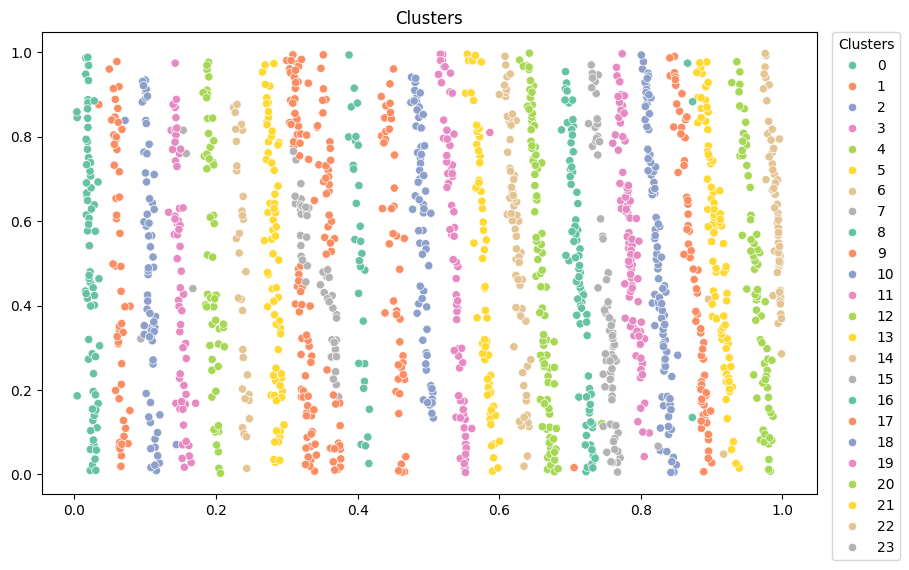

In [727]:
graficar_clusters(df_clusters_fp)

## Reasignación de clusters

Se asignan al cluster correspondiente aquellas plantas que fueron erróneamente asignadas por DBSCAN

In [728]:
falsos_positivos.index

Index([22, 1369], dtype='int64', name='index')

In [729]:
df_clusters.iloc[falsos_positivos.index]

,class_id,x,y,x_rotado,y_rotado,cluster,outlier,distancia,desviacion_estandar
22,0,0.144006,0.070450,-0.065381,0.146377,3,True,0.018658,0.004185
1369,0,0.028143,0.885143,-0.883621,0.059017,0,True,0.018768,0.005260


In [730]:
falsos_positivos['cluster']

index
22      2
1369    0
Name: cluster, dtype: int64

In [731]:
falsos_positivos.loc[:, 'cluster'] = falsos_positivos['cluster'].fillna(-1).astype(int)
df_clusters.loc[falsos_positivos.index, ['cluster', 'outlier']] = falsos_positivos[['cluster', 'outlier']].values

In [732]:
df_clusters.iloc[falsos_positivos.index]

,class_id,x,y,x_rotado,y_rotado,cluster,outlier,distancia,desviacion_estandar
22,0,0.144006,0.070450,-0.065381,0.146377,2,False,0.018658,0.004185
1369,0,0.028143,0.885143,-0.883621,0.059017,0,False,0.018768,0.005260


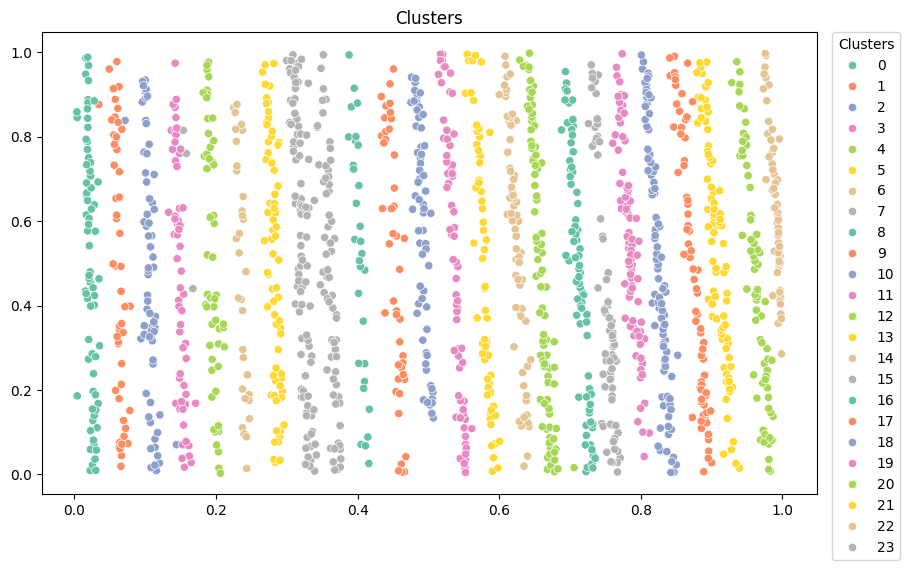

Puntos reasignados:


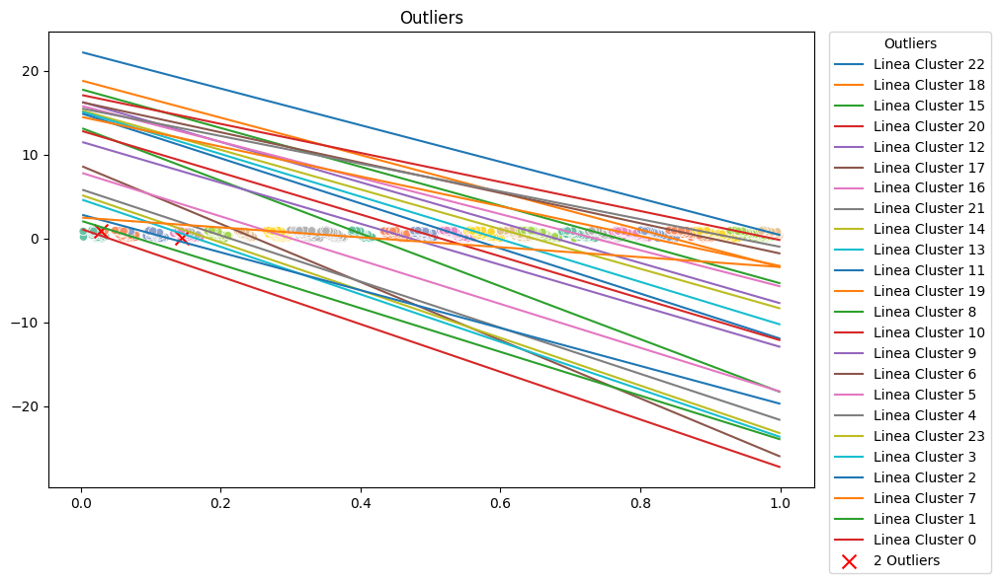

In [733]:
# Clusters correctamente asignados
graficar_clusters(df_clusters)
print('Puntos reasignados:')
graficar_outliers(df_clusters, df_lines, falsos_positivos)

----

# Output del pipeline

## Conteo final

In [734]:
df_labels = pd.merge(df_labels,df_clusters[['cluster','outlier']],how='left', left_index=True, right_index=True)
df_labels['cluster'] = df_labels['cluster'].astype(int)
df_labels

,class_id,x_center,y_center,width,height,cluster,outlier
0,0,0.022295,0.009320,0.015351,0.018092,0,False
1,0,0.025585,0.022204,0.010234,0.009868,0,False
2,0,0.027595,0.070175,0.009137,0.008772,0,False
3,0,0.026133,0.127741,0.010965,0.008224,0,False
4,0,0.022661,0.059211,0.018640,0.013158,0,False
...,...,...,...,...,...,...,...
1571,0,0.974232,0.948739,0.009503,0.008772,22,False
1572,0,0.976791,0.992599,0.013158,0.012610,22,False
1573,0,0.939693,0.873081,0.011696,0.006031,20,False
1574,0,0.975694,0.997533,0.014985,0.006579,22,False


In [735]:
if len(df_labels) == len(df_clusters):
    print("No se han perdido etiquetas en el proceso.")
else:
    print("CUIDADO: Se han perdido etiquetas en el proceso.")

No se han perdido etiquetas en el proceso.


In [736]:
df_plants = df_labels[df_labels['outlier']==False]
df_plants

,class_id,x_center,y_center,width,height,cluster,outlier
0,0,0.022295,0.009320,0.015351,0.018092,0,False
1,0,0.025585,0.022204,0.010234,0.009868,0,False
2,0,0.027595,0.070175,0.009137,0.008772,0,False
3,0,0.026133,0.127741,0.010965,0.008224,0,False
4,0,0.022661,0.059211,0.018640,0.013158,0,False
...,...,...,...,...,...,...,...
1571,0,0.974232,0.948739,0.009503,0.008772,22,False
1572,0,0.976791,0.992599,0.013158,0.012610,22,False
1573,0,0.939693,0.873081,0.011696,0.006031,20,False
1574,0,0.975694,0.997533,0.014985,0.006579,22,False


In [737]:
n_plants = len(df_plants)
n_outliers = len(verdaderos_positivos)
print(f"Se han detectado un total de {n_plants} plantas y {n_outliers} outliers (malezas).")

Se han detectado un total de 1449 plantas y 127 outliers (malezas).


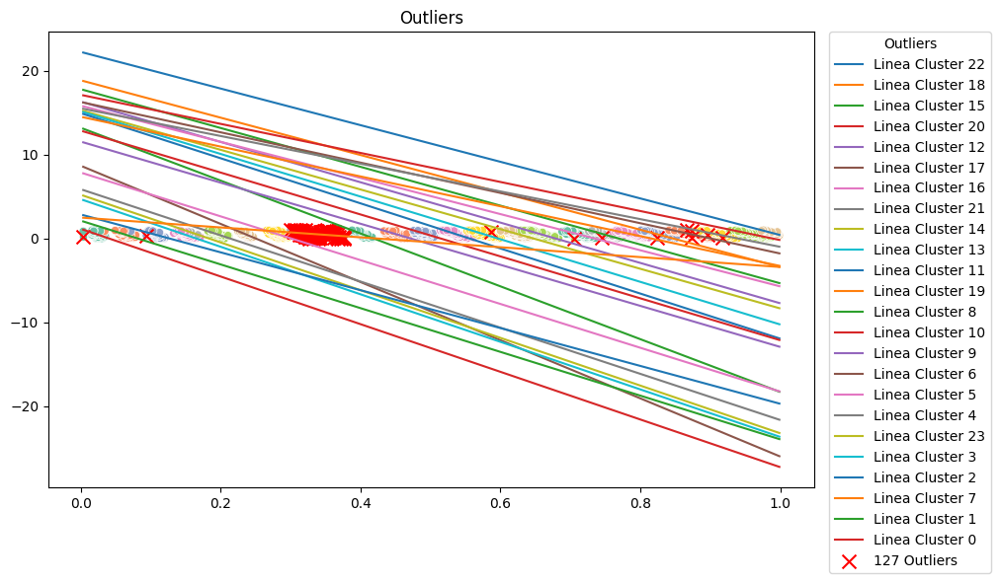

In [738]:
# Outliers detectados
graficar_outliers(df_clusters, df_lines, df_outliers)

## Densidad de plantas

| Altura | cm/px | Área (m2) |
|---|---|---|
| 3 | 0.070 | 9.8092760003 |
| 3.5 | 0.082 | 13.3515145559 |
| 5 | 0.120 | 28.7450726400 |

In [739]:
altura = 3.5 # Setear para distintas alturas

resolucion = {
    'Altura': [3, 3.5, 5],
    'Resolucion': [0.070, 0.082, 0.120],
    'Area': [9.8092760003, 13.3515145559, 28.7450726400]
}

if altura not in resolucion['Altura']:
    raise ValueError(f"❕No se ha definido el área cubierta para la altura {altura}m.\nAlturas disponibles: {resolucion['Altura']}")

area = resolucion['Area'][resolucion['Altura'].index(altura)]
print(f"El área cubierta por la fotografía a {altura}m es de {area:.2f}m².")

El área cubierta por la fotografía a 3.5m es de 13.35m².


In [740]:
# DENSIDAD: plantas/hectárea

# Calcular la densidad en plantas por metro cuadrado
densidad_m2 = n_plants / area

# Convertir la densidad a plantas por hectárea
densidad_ha = densidad_m2 * 10000

# Mostrar el resultado
print(f"Se han detectado {n_plants} en un área de {area:.2f}m² a {altura}m de altura.")
print(f"Densidad por hecátera: {densidad_ha:,.1f} plantas/ha")
print(f"La densidad de plantas es de {densidad_m2:.2f} plantas/m².")

Se han detectado 1449 en un área de 13.35m² a 3.5m de altura.
Densidad por hecátera: 1,085,270.1 plantas/ha
La densidad de plantas es de 108.53 plantas/m².


_**REFERENCIA:** el conteo de aro para el lote 209(310) fue 148 pl/m² y el promedio para todo el lote 209 fue 128 pl/m²._
- La densidad de siembra recomendada suele estar entre 150 a 300 pl/m².
- El objetivo de siembra del cliente para esta campaña fue 200 pl/m².

-----

In [741]:
# End of loop turn
end_time = time.perf_counter() # Mide tiempo  de ejecución
elapsed_time = end_time - start_time
print(f"⏰ Tiempo total de procesamiento: {elapsed_time:.3f} segundos")

⏰ Tiempo total de procesamiento: 8.508 segundos


---
# Visualziación de resultados

In [742]:
H, W, _ = im.shape

In [743]:
H, W

(3648, 5472)

# Visualización de etiquetas

## Procesamiento del DataFrame

### Absolute values

In [744]:
columnas = df_plants.columns
columnas

Index(['class_id', 'x_center', 'y_center', 'width', 'height', 'cluster',
       'outlier'],
      dtype='object')

In [745]:
# Se transforma el formato de relativo a absoluto
df_labels_abs = label_transform(df_plants[columnas.drop(['cluster','outlier'])], 'absolute', im_height=H, im_width=W)
df_labels_abs

,class_id,x_center,y_center,width,height
0,0,122,34,84,66
1,0,140,81,56,36
2,0,151,256,50,32
3,0,143,466,60,30
4,0,124,216,102,48
...,...,...,...,...,...
1571,0,5331,3461,52,32
1572,0,5345,3621,72,46
1573,0,5142,3185,64,22
1574,0,5339,3639,82,24


### Bounding Boxes calculation

In [746]:
df_BBoxes = lbl_to_bb(df_labels_abs)
df_BBoxes

,class_id,x0,x1,y0,y1
0,0,80,164,1,67
1,0,112,168,63,99
2,0,126,176,240,272
3,0,113,173,451,481
4,0,73,175,192,240
...,...,...,...,...,...
1444,0,5305,5357,3445,3477
1445,0,5309,5381,3598,3644
1446,0,5110,5174,3174,3196
1447,0,5298,5380,3627,3651


## Visualización puntos

In [747]:
df_labels_abs

,class_id,x_center,y_center,width,height
0,0,122,34,84,66
1,0,140,81,56,36
2,0,151,256,50,32
3,0,143,466,60,30
4,0,124,216,102,48
...,...,...,...,...,...
1571,0,5331,3461,52,32
1572,0,5345,3621,72,46
1573,0,5142,3185,64,22
1574,0,5339,3639,82,24


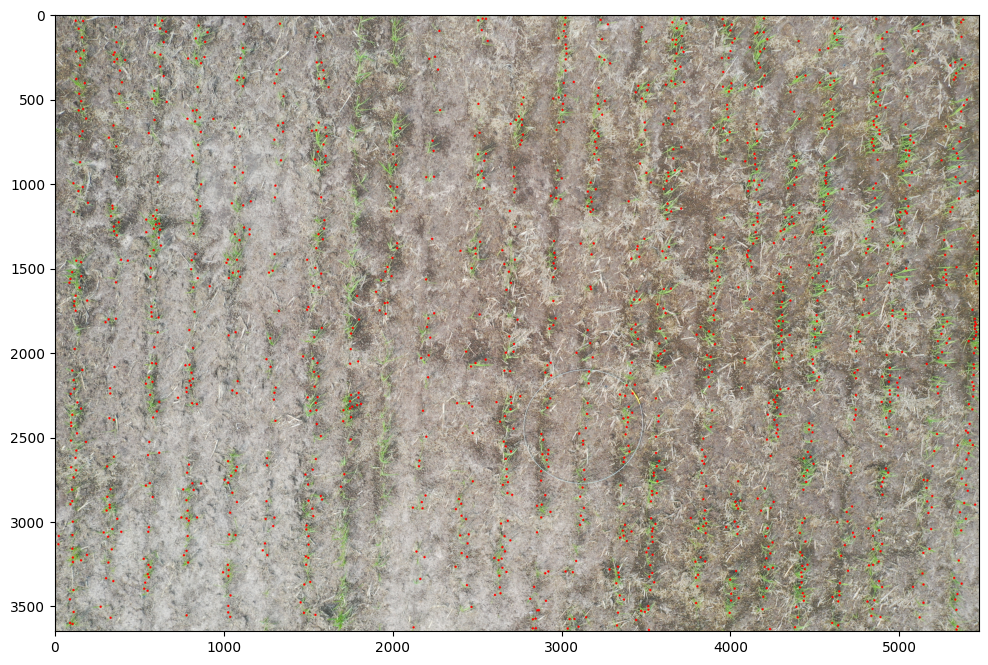

In [748]:
draw_points(im, df_labels_abs)

Al parecer el gráfico de los clusters se encuentra espejado verticalmente (flip).

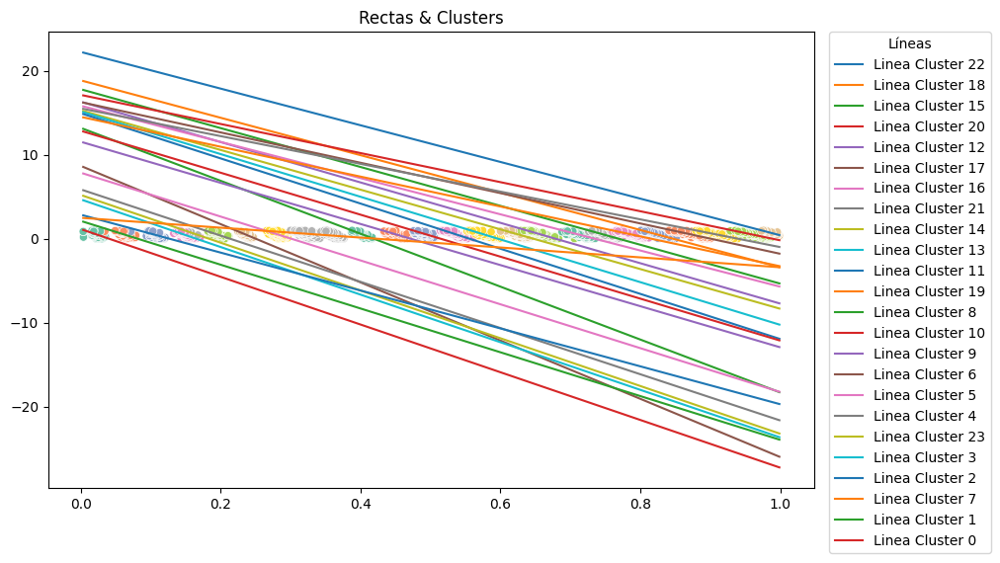

In [749]:
graficar_lineas_clusters(df_clusters,df_lines)

## Visualización Bounding Boxes

In [750]:
df_BBoxes

,class_id,x0,x1,y0,y1
0,0,80,164,1,67
1,0,112,168,63,99
2,0,126,176,240,272
3,0,113,173,451,481
4,0,73,175,192,240
...,...,...,...,...,...
1444,0,5305,5357,3445,3477
1445,0,5309,5381,3598,3644
1446,0,5110,5174,3174,3196
1447,0,5298,5380,3627,3651


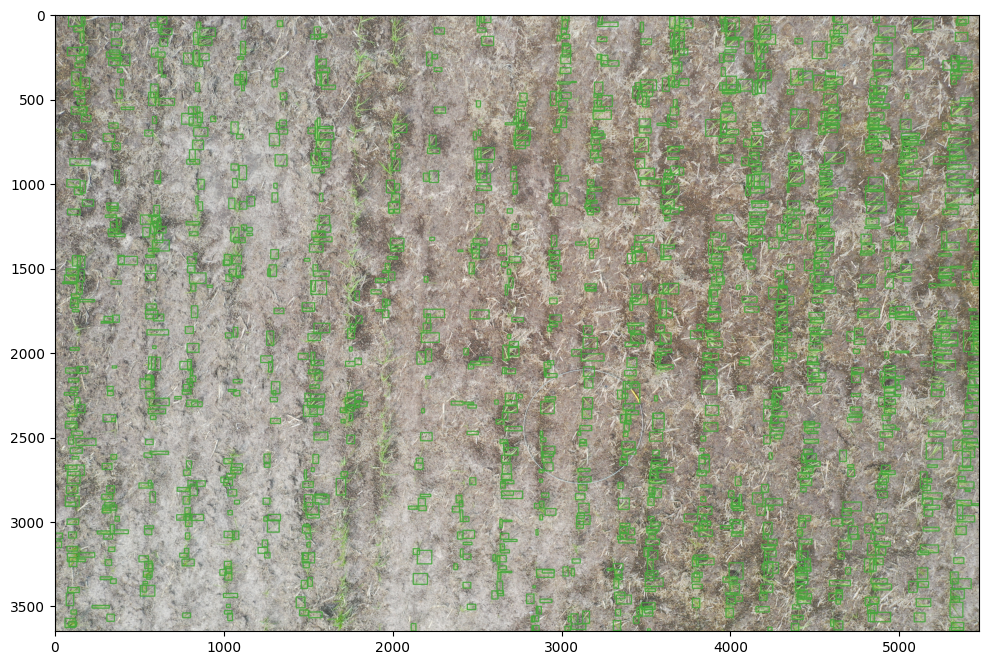

In [751]:
# Se deben enviar copias del array y dataframe por ser objetos mutables
draw_bb(im,df_BBoxes)

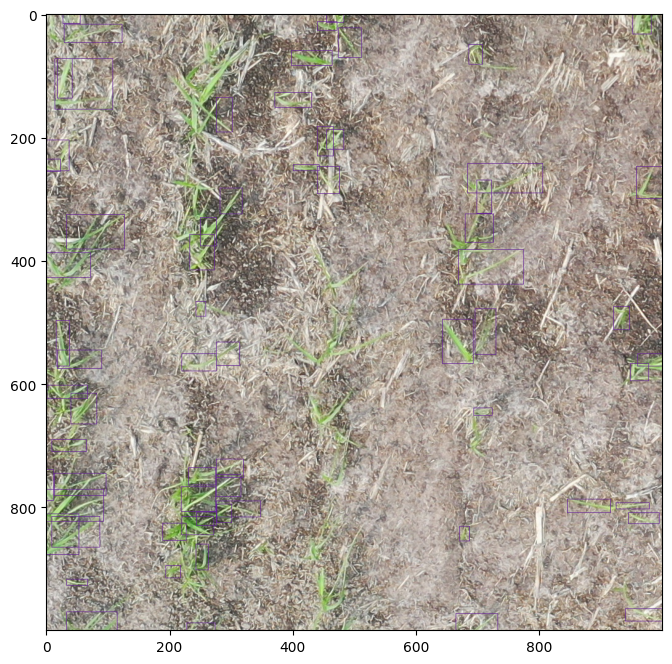

In [752]:
#ZOOM IN
Position = (1500, 1500); Width = 1000; Height = Width
zoom = (Position[0], Position[0]+Width, Position[1], Position[1]+Height)
draw_bb(im,df_BBoxes, zoom=zoom)